# Imports

In [1]:
#from google.colab import drive
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import json

In [ ]:
drive.mount('/content/drive')

! cp "/content/drive/Shareddrives/Computer Vision/Data/CV_subset.zip" "CV_subset.zip"
! cp "/content/drive/Shareddrives/Computer Vision/Data/CV_dataset.csv" "CV_dataset.csv"

! unzip -q "CV_subset.zip"

! rm "CV_subset.zip"

'unzip' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.
'rm' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.


# Body Part Polygons

In [2]:
df_poly = pd.read_csv("Human_limbs_annotations.csv")
df_poly.head()

,filename,file_size,file_attributes,region_count,region_id,region_shape_attributes,region_attributes
0,verrine-bagasse-carree-50-ml-par-50.jpg,17969,"{""caption"":"""",""public_domain"":""no"",""image_url""...",1,0,"{""name"":""polygon"",""all_points_x"":[263,222,186,...","{""name"":""hand"",""type"":""human"",""image_quality"":..."
1,toque-plissee-papier-jetable-noire-23-cm-par-1...,32428,"{""caption"":"""",""public_domain"":""no"",""image_url""...",1,0,"{""name"":""polygon"",""all_points_x"":[167,160,156,...","{""name"":""bust"",""type"":""human"",""image_quality"":..."
2,toque-de-cuisine-jetable-reglable-23-cm-par-10...,27787,"{""caption"":"""",""public_domain"":""no"",""image_url""...",1,0,"{""name"":""polygon"",""all_points_x"":[200,206,215,...","{""name"":""head"",""type"":""human"",""image_quality"":..."
3,tablier-plastique-jetable-gaufre-60-microns-70...,15287,"{""caption"":"""",""public_domain"":""no"",""image_url""...",3,0,"{""name"":""polygon"",""all_points_x"":[252,253,254,...","{""name"":""head"",""type"":""human"",""image_quality"":..."
4,tablier-plastique-jetable-gaufre-60-microns-70...,15287,"{""caption"":"""",""public_domain"":""no"",""image_url""...",3,1,"{""name"":""polygon"",""all_points_x"":[225,224,227,...","{""name"":""hand"",""type"":""human"",""image_quality"":..."


In [3]:
df_poly.count()

filename                   107
file_size                  107
file_attributes            107
region_count               107
region_id                  107
region_shape_attributes    107
region_attributes          107
dtype: int64

In [4]:
df_poly['region_shape_attributes'][10]

'{"name":"polygon","all_points_x":[330,325,324,324,323,325,329,331,336,341,347,351,351,344,337,333],"all_points_y":[284,289,298,306,312,313,310,307,308,308,304,297,290,285,284,284]}'

In [5]:
df_poly['region_shape_attributes_json'] = df_poly['region_shape_attributes'].apply(json.loads)

In [6]:
filenames = df_poly[df_poly['region_attributes'] != "{}"]["filename"].values
len(filenames)

107

In [7]:
df_expanded = df_poly['region_shape_attributes_json'].apply(pd.Series)
df_expanded.head()

,name,all_points_x,all_points_y
0,polygon,"[263, 222, 186, 176, 131, 107, 79, 57, 56, 152...","[234, 216, 207, 204, 219, 232, 237, 250, 503, ..."
1,polygon,"[167, 160, 156, 135, 133, 134, 138, 138, 142, ...","[222, 232, 244, 250, 254, 260, 271, 283, 291, ..."
2,polygon,"[200, 206, 215, 229, 249, 272, 299, 324, 348, ...","[234, 228, 225, 224, 224, 226, 229, 236, 246, ..."
3,polygon,"[252, 253, 254, 257, 259, 266, 268, 269, 268, ...","[55, 64, 76, 88, 93, 96, 101, 109, 116, 118, 1..."
4,polygon,"[225, 224, 227, 228, 238, 239, 230, 227]","[292, 296, 305, 309, 309, 280, 279, 289]"


In [8]:
df_poly = df_poly.join(df_expanded)

In [9]:
df_poly.head(2)

,filename,file_size,file_attributes,region_count,region_id,region_shape_attributes,region_attributes,region_shape_attributes_json,name,all_points_x,all_points_y
0,verrine-bagasse-carree-50-ml-par-50.jpg,17969,"{""caption"":"""",""public_domain"":""no"",""image_url""...",1,0,"{""name"":""polygon"",""all_points_x"":[263,222,186,...","{""name"":""hand"",""type"":""human"",""image_quality"":...","{'name': 'polygon', 'all_points_x': [263, 222,...",polygon,"[263, 222, 186, 176, 131, 107, 79, 57, 56, 152...","[234, 216, 207, 204, 219, 232, 237, 250, 503, ..."
1,toque-plissee-papier-jetable-noire-23-cm-par-1...,32428,"{""caption"":"""",""public_domain"":""no"",""image_url""...",1,0,"{""name"":""polygon"",""all_points_x"":[167,160,156,...","{""name"":""bust"",""type"":""human"",""image_quality"":...","{'name': 'polygon', 'all_points_x': [167, 160,...",polygon,"[167, 160, 156, 135, 133, 134, 138, 138, 142, ...","[222, 232, 244, 250, 254, 260, 271, 283, 291, ..."


In [10]:
df_poly = df_poly[df_poly['all_points_x'].notna()]
df_poly = df_poly.drop(["file_size","file_attributes","region_shape_attributes", "region_attributes", "region_shape_attributes_json", "name"], axis=1)
df_poly.shape

(107, 5)

In [11]:
df_poly.head()

,filename,region_count,region_id,all_points_x,all_points_y
0,verrine-bagasse-carree-50-ml-par-50.jpg,1,0,"[263, 222, 186, 176, 131, 107, 79, 57, 56, 152...","[234, 216, 207, 204, 219, 232, 237, 250, 503, ..."
1,toque-plissee-papier-jetable-noire-23-cm-par-1...,1,0,"[167, 160, 156, 135, 133, 134, 138, 138, 142, ...","[222, 232, 244, 250, 254, 260, 271, 283, 291, ..."
2,toque-de-cuisine-jetable-reglable-23-cm-par-10...,1,0,"[200, 206, 215, 229, 249, 272, 299, 324, 348, ...","[234, 228, 225, 224, 224, 226, 229, 236, 246, ..."
3,tablier-plastique-jetable-gaufre-60-microns-70...,3,0,"[252, 253, 254, 257, 259, 266, 268, 269, 268, ...","[55, 64, 76, 88, 93, 96, 101, 109, 116, 118, 1..."
4,tablier-plastique-jetable-gaufre-60-microns-70...,3,1,"[225, 224, 227, 228, 238, 239, 230, 227]","[292, 296, 305, 309, 309, 280, 279, 289]"


In [12]:
df_poly['filenumber'] = df_poly["filename"].rank(method='dense').astype(int)

In [13]:
df_poly.shape

(107, 6)

In [14]:
df_poly.head(10)

,filename,region_count,region_id,all_points_x,all_points_y,filenumber
0,verrine-bagasse-carree-50-ml-par-50.jpg,1,0,"[263, 222, 186, 176, 131, 107, 79, 57, 56, 152...","[234, 216, 207, 204, 219, 232, 237, 250, 503, ...",79
1,toque-plissee-papier-jetable-noire-23-cm-par-1...,1,0,"[167, 160, 156, 135, 133, 134, 138, 138, 142, ...","[222, 232, 244, 250, 254, 260, 271, 283, 291, ...",78
2,toque-de-cuisine-jetable-reglable-23-cm-par-10...,1,0,"[200, 206, 215, 229, 249, 272, 299, 324, 348, ...","[234, 228, 225, 224, 224, 226, 229, 236, 246, ...",77
3,tablier-plastique-jetable-gaufre-60-microns-70...,3,0,"[252, 253, 254, 257, 259, 266, 268, 269, 268, ...","[55, 64, 76, 88, 93, 96, 101, 109, 116, 118, 1...",76
4,tablier-plastique-jetable-gaufre-60-microns-70...,3,1,"[225, 224, 227, 228, 238, 239, 230, 227]","[292, 296, 305, 309, 309, 280, 279, 289]",76
5,tablier-plastique-jetable-gaufre-60-microns-70...,3,2,"[329, 339, 347, 351, 351, 345, 342, 338, 331, ...","[283, 284, 288, 290, 297, 305, 306, 308, 310, ...",76
6,tablier-plastique-jetable-gaufre-35-microns-70...,3,0,"[257, 250, 250, 251, 250, 252, 252, 252, 253, ...","[25, 31, 39, 43, 46, 50, 53, 59, 70, 78, 83, 8...",75
7,tablier-plastique-jetable-gaufre-35-microns-70...,3,1,"[211, 207, 212, 217, 224, 228, 231, 231, 229, ...","[294, 306, 320, 322, 322, 320, 316, 313, 311, ...",75
8,tablier-plastique-jetable-gaufre-35-microns-70...,3,2,"[311, 311, 308, 311, 313, 316, 320, 326, 330, ...","[304, 316, 328, 330, 332, 334, 334, 331, 331, ...",75
9,tablier-jetable-plastique-noir-50-microns-70-x...,3,0,"[253, 254, 253, 254, 257, 259, 266, 267, 267, ...","[60, 63, 68, 79, 88, 94, 96, 99, 103, 106, 109...",74


In [15]:
df_poly[df_poly['filename'] == 'tablier-plastique-jetable-gaufre-35-microns-70-x-120-cm-par-50.jpg']

,filename,region_count,region_id,all_points_x,all_points_y,filenumber
6,tablier-plastique-jetable-gaufre-35-microns-70...,3,0,"[257, 250, 250, 251, 250, 252, 252, 252, 253, ...","[25, 31, 39, 43, 46, 50, 53, 59, 70, 78, 83, 8...",75
7,tablier-plastique-jetable-gaufre-35-microns-70...,3,1,"[211, 207, 212, 217, 224, 228, 231, 231, 229, ...","[294, 306, 320, 322, 322, 320, 316, 313, 311, ...",75
8,tablier-plastique-jetable-gaufre-35-microns-70...,3,2,"[311, 311, 308, 311, 313, 316, 320, 326, 330, ...","[304, 316, 328, 330, 332, 334, 334, 331, 331, ...",75


In [16]:
df_poly[df_poly['region_count'] > 1]['filenumber'][:5]

3    76
4    76
5    76
6    75
7    75
Name: filenumber, dtype: int32

In [17]:
df_filenames = df_poly.drop_duplicates(['filename', 'filenumber', 'region_count'])[['filename', 'filenumber', 'region_count']].set_index('filenumber')

In [18]:
df_filenames.loc[1, 'filename']

'barquette-plastique-blanche-avec-couvercle-450-ml-par-200.jpg'

# Data exploration

In [19]:
df = pd.read_csv("CV_dataset.csv")
df.head(2)

,filename,watermark,humans,food_inside,multiple_containers,text,background,drawing,name,Agréé contact alimentaire,...,Utilisation four traditionnel,Utilisation micro-ondes,Groupe Produit,Code Groupe Produit,Code Enseigne,Epaisseur en microns,Personnalisable,Diamètre,Colisage en kg,Nombre de feuilles par paquet de 10kg
0,barquette-plastique-blanche-avec-couvercle-450...,0,1,0,0,0,0,0,Barquette Carty micro-ondable 450 ml | Mon-emb...,Oui,...,Non,Oui,BOITE CARTY OPAQUE AVEC COUVERCLE,7.0,909421320.0,NaN,NaN,NaN,NaN,NaN
1,barquette-plastique-blanche-avec-couvercle-750...,0,1,0,0,0,0,0,Barquette 750 ml micro-ondable Carty blanche |...,Oui,...,Non,Oui,BOITE CARTY OPAQUE AVEC COUVERCLE,7.0,909421317.0,NaN,NaN,NaN,NaN,NaN


Nothing interesting here for non-deep learning techniques.

In [20]:
if len(df["filename"].unique()) == df.shape[0]:
  print('No duplicate images in dataset')
else:
  print('Duplicate images in dataset')

No duplicate images in dataset


In [21]:
print(df["humans"].value_counts())

filenames = df[df["humans"] == 1]["filename"].values
print('\nFinal dataset size:', len(filenames))

humans
1    80
0    80
Name: count, dtype: int64

Final dataset size: 80


We have 80 images without humans and 80 with humans. As we don't do DL technique, we are interested by the humans pictures only.

In [22]:
def load_img(filename):
  img = cv2.imread(f"CV_subset/CV_subset/{filename}")
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

### All pictures

Working with image: verrine-bagasse-carree-50-ml-par-50.jpg


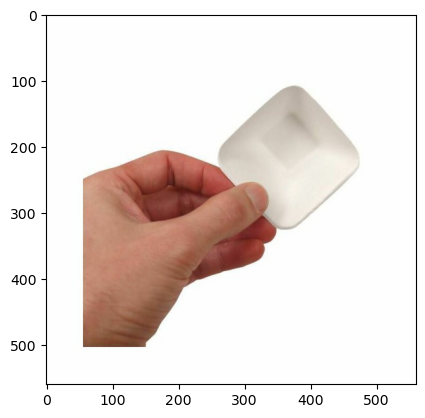

Working with image: toque-plissee-papier-jetable-noire-23-cm-par-10.jpg


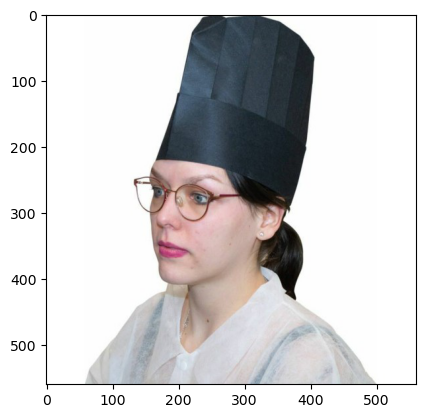

Working with image: toque-de-cuisine-jetable-reglable-23-cm-par-10.jpg


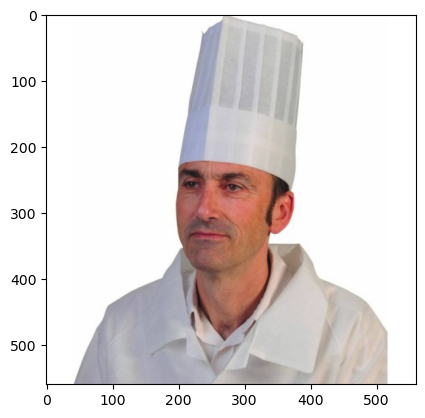

Working with image: tablier-plastique-jetable-gaufre-60-microns-70-x-140-cm-par-50.jpg


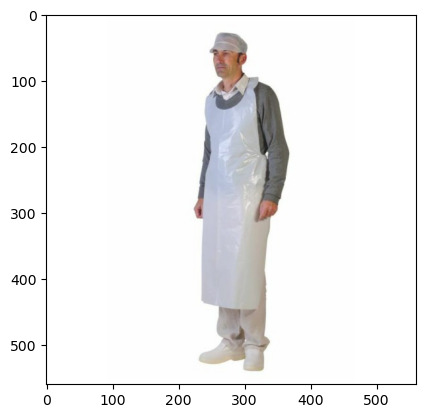

Working with image: tablier-plastique-jetable-gaufre-60-microns-70-x-140-cm-par-50.jpg


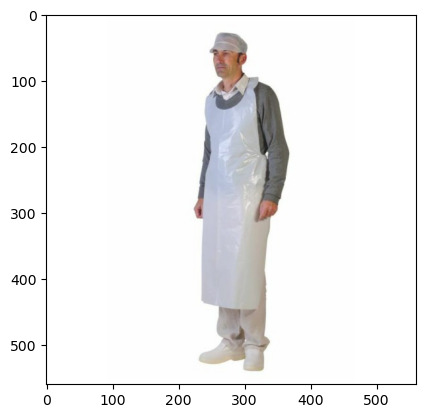

Working with image: tablier-plastique-jetable-gaufre-60-microns-70-x-140-cm-par-50.jpg


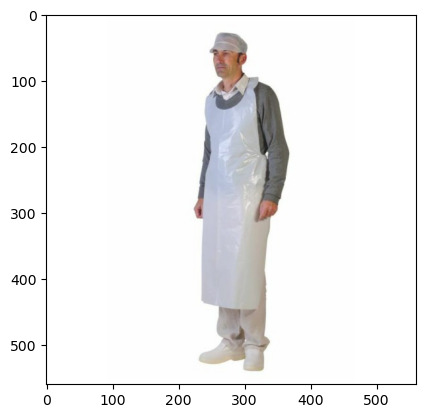

Working with image: tablier-plastique-jetable-gaufre-35-microns-70-x-120-cm-par-50.jpg


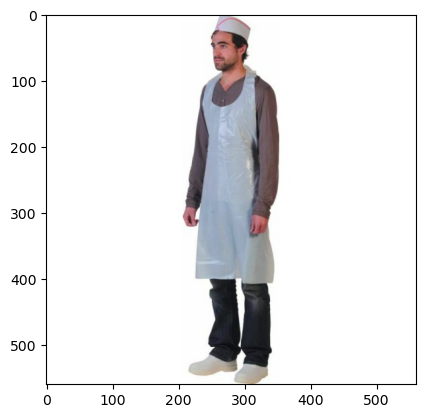

Working with image: tablier-plastique-jetable-gaufre-35-microns-70-x-120-cm-par-50.jpg


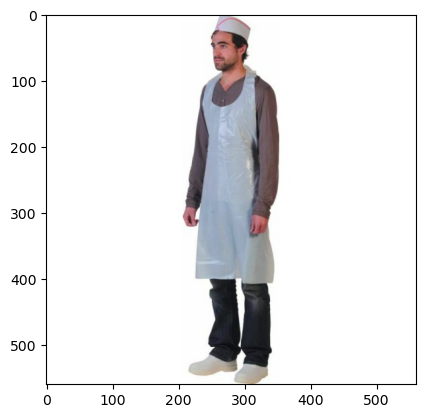

Working with image: tablier-plastique-jetable-gaufre-35-microns-70-x-120-cm-par-50.jpg


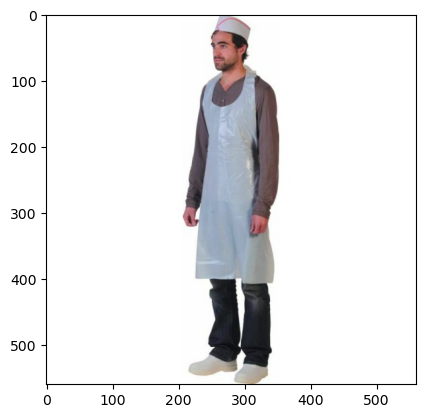

Working with image: tablier-jetable-plastique-noir-50-microns-70-x-120-cm-par-50.jpg


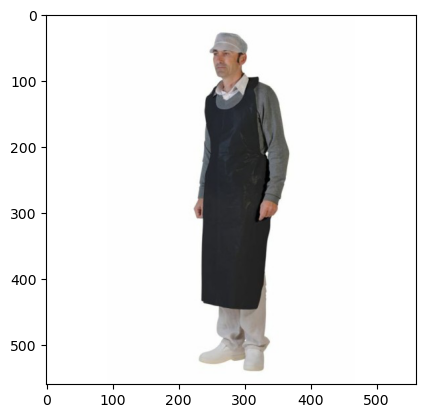

Working with image: tablier-jetable-plastique-noir-50-microns-70-x-120-cm-par-50.jpg


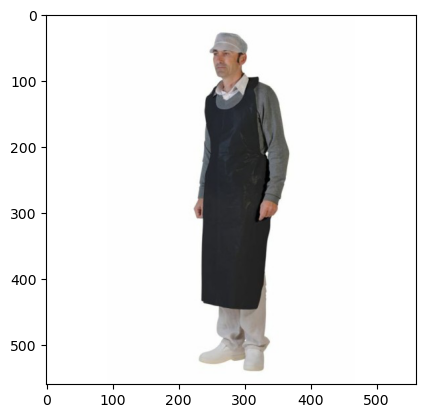

Working with image: tablier-jetable-plastique-noir-50-microns-70-x-120-cm-par-50.jpg


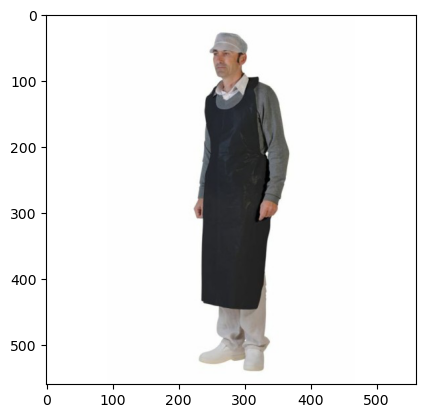

Working with image: surblouse-jetable-plastique-blanc-a-pression-par-50.jpg


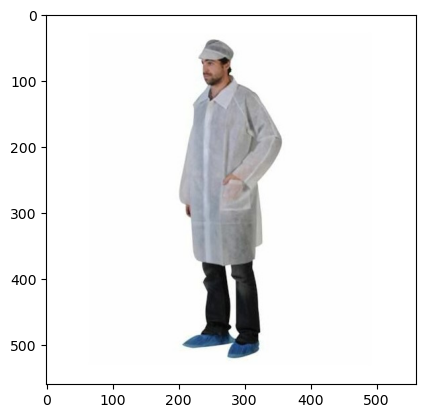

Working with image: surblouse-jetable-plastique-blanc-a-pression-par-50.jpg


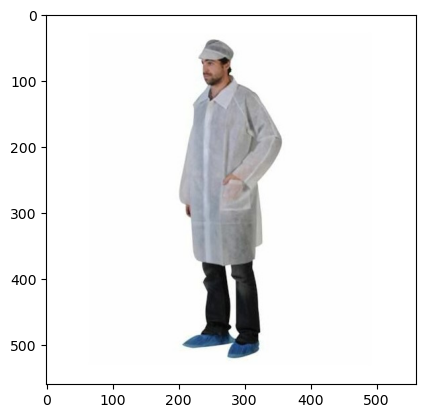

Working with image: surblouse-jetable-plastique-blanc-a-pression-par-50.jpg


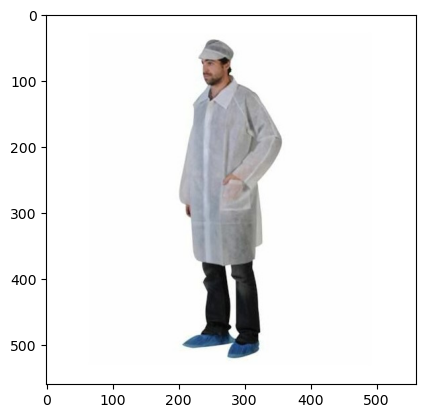

Working with image: saladier-plastique-transparent-14-cm-par-50.jpg


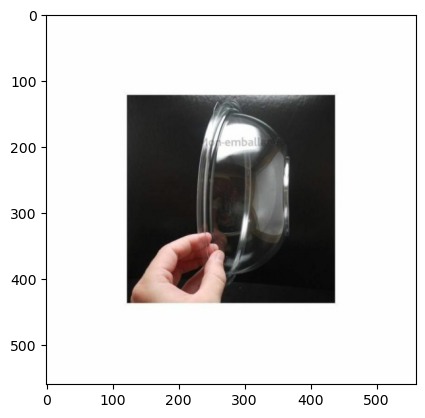

Working with image: sachet-croissants-papier-kraft-brun-14-7-x-28-cm-n104-par-1000.jpg


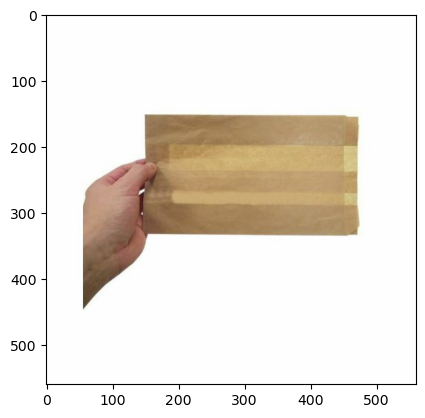

Working with image: sachet-croissants-papier-kraft-brun-14-7-x-21-cm-n103-par-1000.jpg


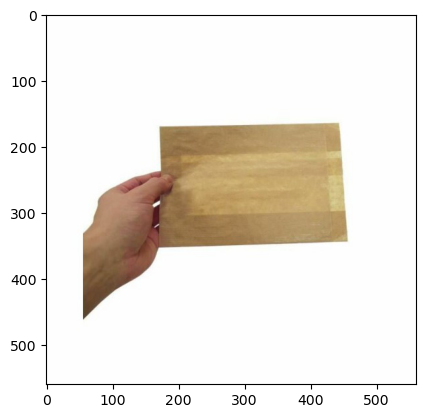

Working with image: sachet-croissants-papier-kraft-brun-12-5-x-16-cm-n101-par-1000.jpg


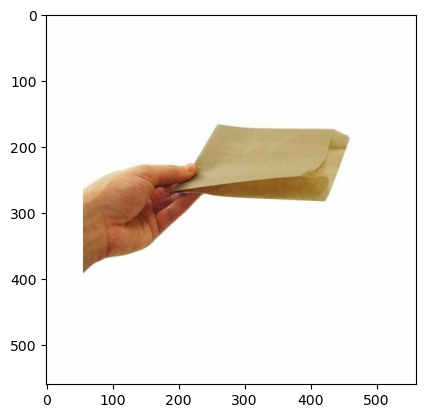

Working with image: sachet-cone-kraft-times-295-x-21-cm-par-250.jpg


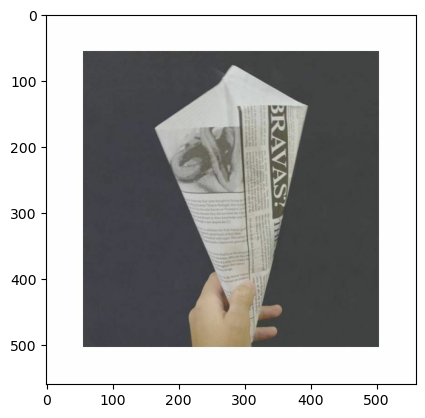

Working with image: sachet-cone-kraft-times-295-x-21-cm-par-250.jpg


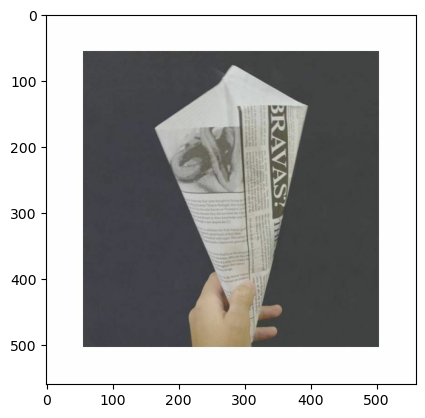

Working with image: sachet-cone-kraft-times-295-x-21-cm-par-250.jpg


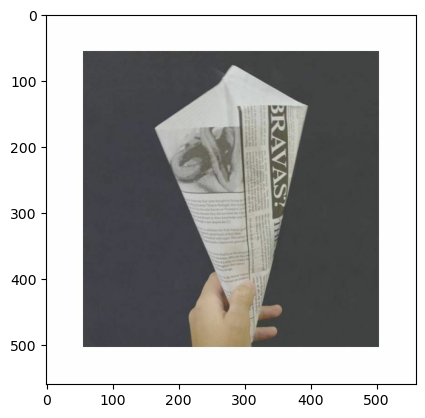

Working with image: sachet-cone-kraft-feel-green-295-x-21-cm-par-250.jpg


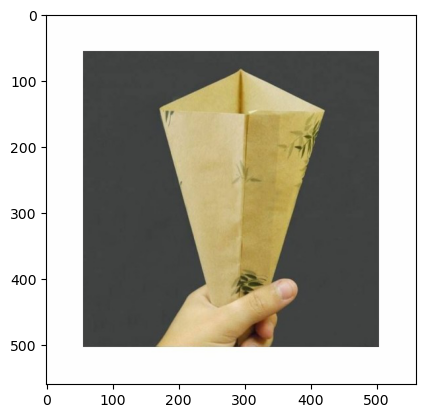

Working with image: sachet-cone-en-kraft-times-34-x-24-cm-par-250.jpg


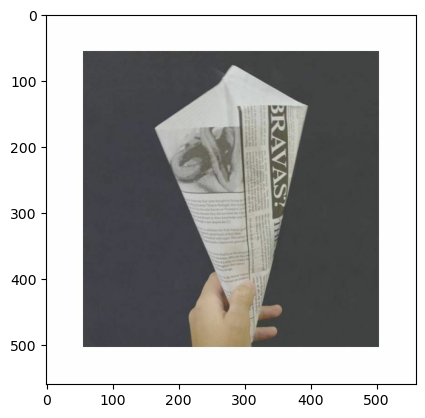

Working with image: sachet-cone-en-kraft-times-34-x-24-cm-par-250.jpg


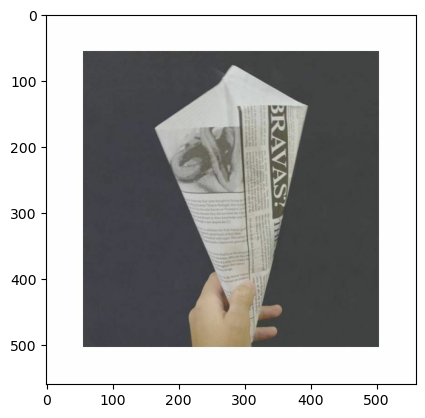

Working with image: sachet-cone-en-kraft-times-34-x-24-cm-par-250.jpg


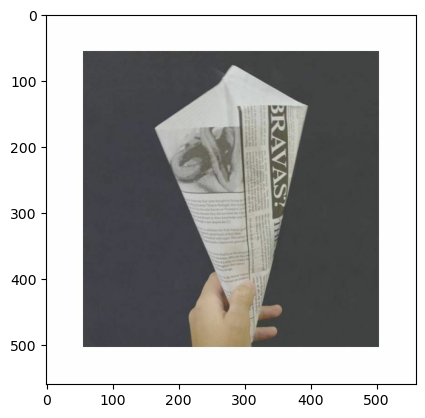

Working with image: sac-traiteur-kraft-brun-recycle-a-poignees-plates-32-x-21-x-27-cm-par-250.jpg


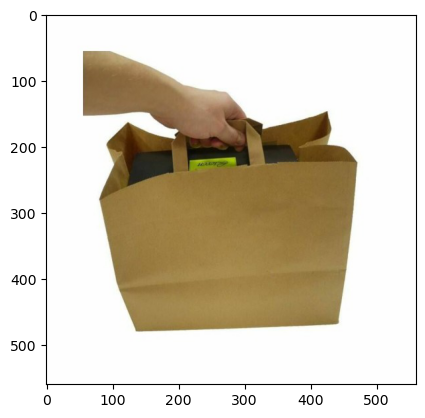

Working with image: sac-papier-kraft-brun-a-poignees-plates-32-17-x-43-cm-par-50.jpg


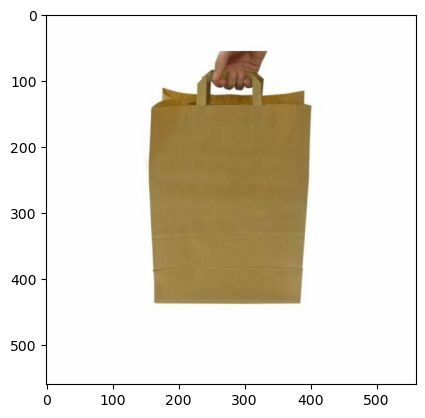

Working with image: sac-papier-kraft-brun-a-poignees-plates-32-17-x-27-cm-par-50.jpg


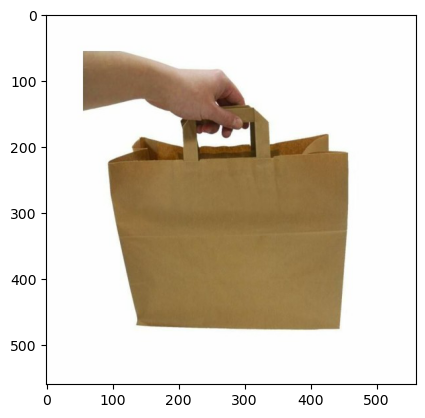

Working with image: sac-papier-kraft-brun-a-poignees-plates-18-8-x-22-cm-par-50.jpg


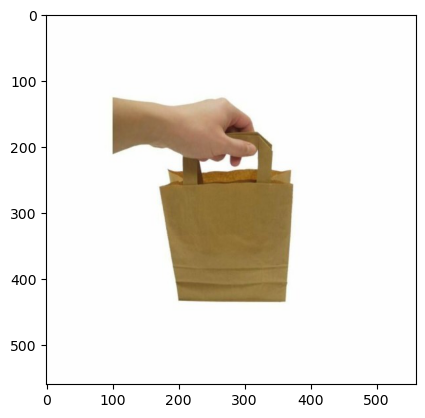

Working with image: sac-cabas-traiteur-plastique-avec-renfort-de-fond-32-x-22-x-30-cm-par-25.jpg


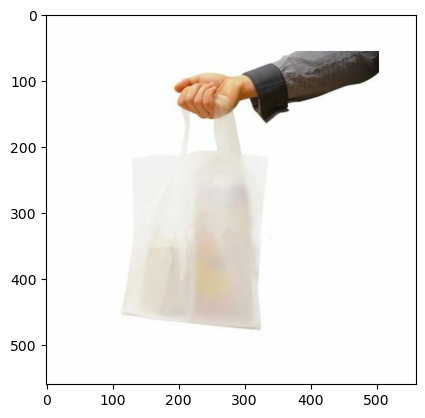

Working with image: sac-cabas-traiteur-plastique-avec-renfort-de-fond-22-x-21-x-28-cm-par-25.jpg


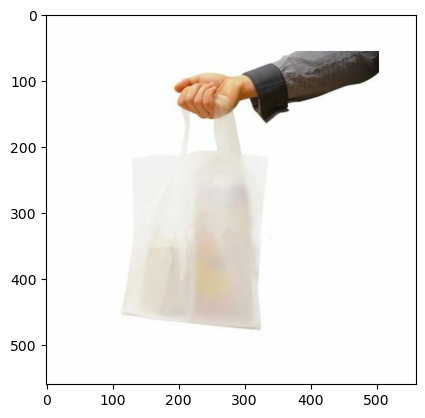

Working with image: sac-bouteille-kraft-brun-verge-14-8-x-39-cm-par-50.jpg


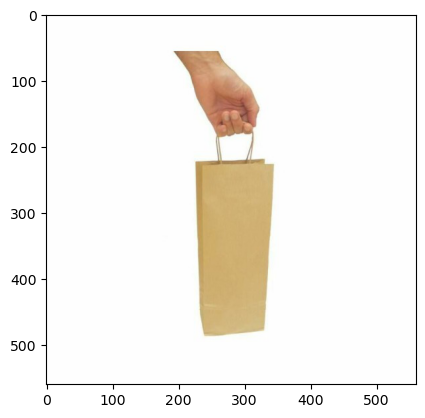

Working with image: pot-carton-blanc-480-ml-par-25.jpg


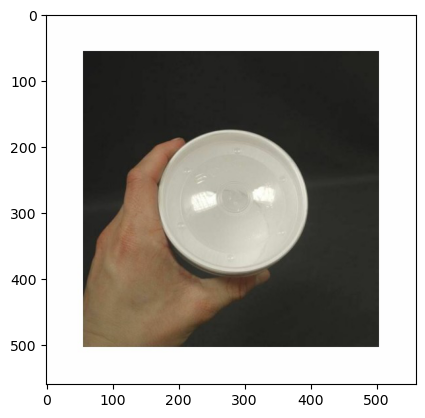

Working with image: petit-etui-a-frites-kraft-brun-en-carton-250-ml-par-600.jpg


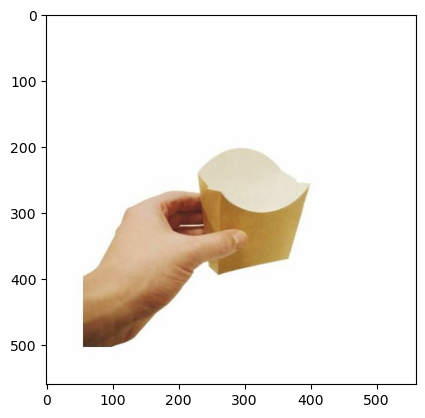

Working with image: moyenne-boite-hamburger-kraft-brun-124-x-124-x-7-cm-par-450.jpg


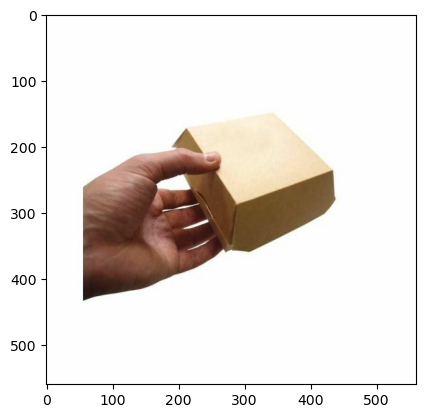

Working with image: mini-bol-bagasse-100-ml-par-50.jpg


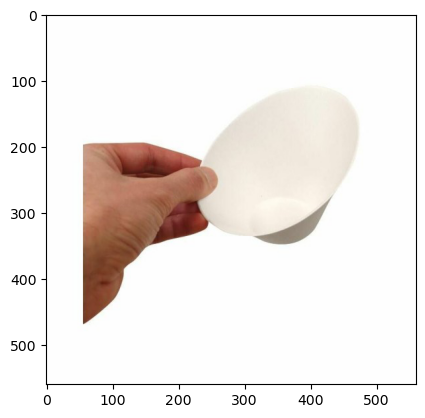

Working with image: mini-assiette-carree-bagasse-66-x-66-cm-par-50.jpg


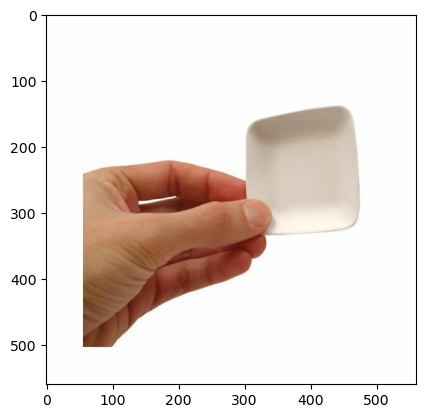

Working with image: masque-chirurgical-bleu-jetable-par-50.jpg


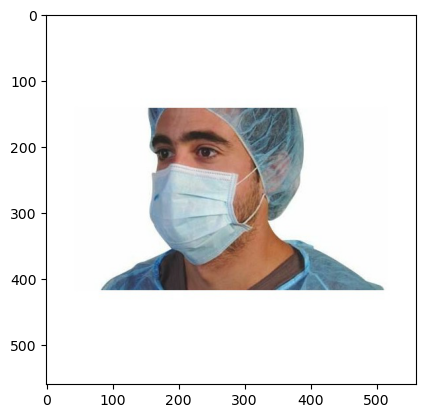

Working with image: manchette-plastique-non-tisse-20-x-40-cm-par-100.jpg


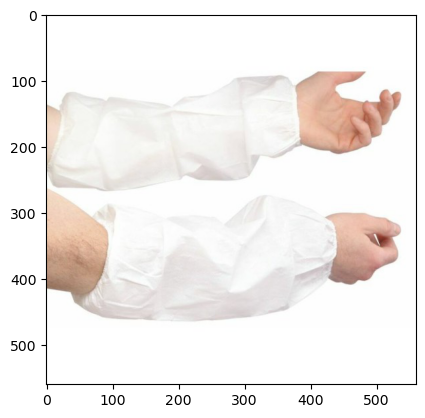

Working with image: manchette-plastique-non-tisse-20-x-40-cm-par-100.jpg


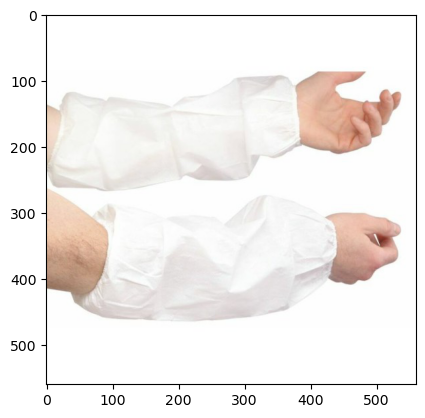

Working with image: manchette-plastique-non-tisse-20-x-40-cm-par-100.jpg


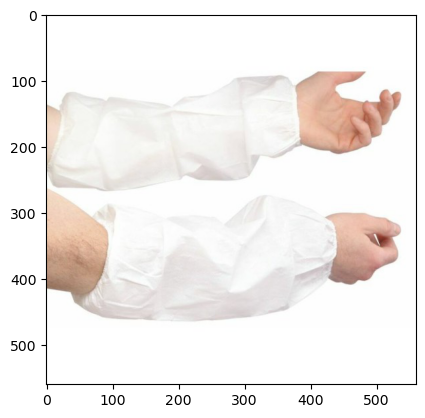

Working with image: manchette-plastique-non-tisse-20-x-40-cm-par-100.jpg


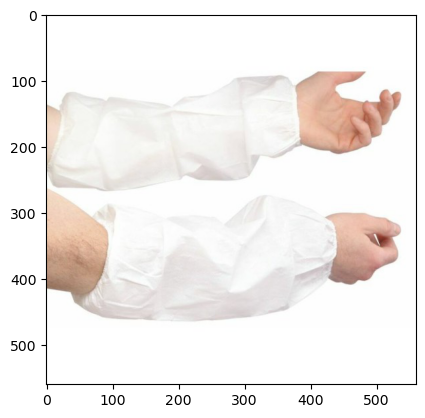

Working with image: manchette-elastiquee-plastique-opaque-blanc-20-x-40-cm-par-100.jpg


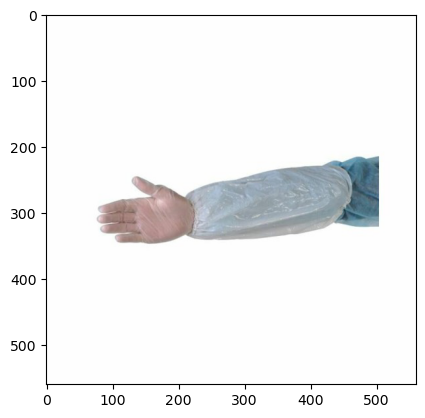

Working with image: kit-visiteur-jetable-par-100.jpg


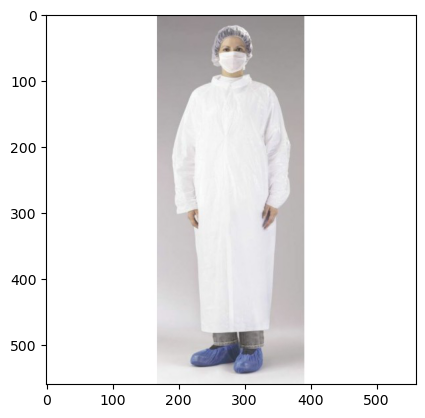

Working with image: kit-visiteur-jetable-par-100.jpg


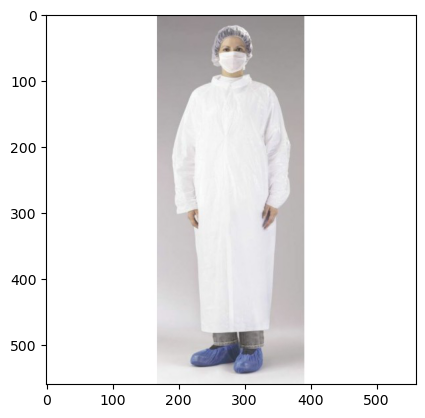

Working with image: kit-visiteur-jetable-par-100.jpg


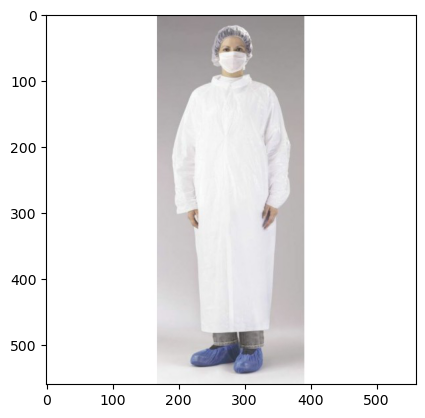

Working with image: kit-visiteur-jetable-par-100.jpg


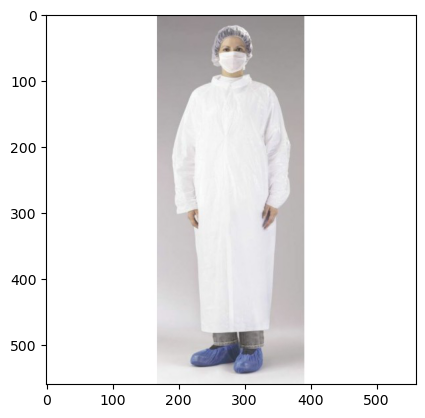

Working with image: grand-etui-a-frites-kraft-brun-500-ml-par-400.jpg


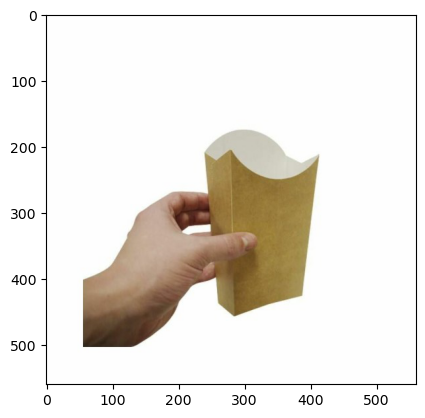

Working with image: grand-coffret-a-frites-refermable-kraft-brun-500-ml-par-450.jpg


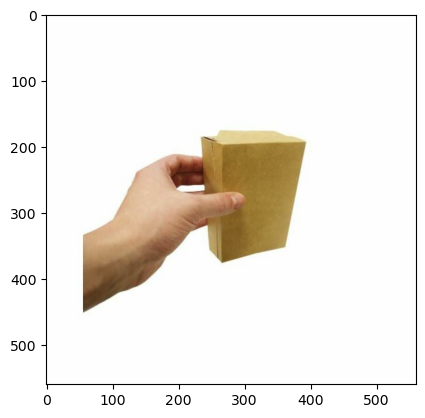

Working with image: gants-vinyle-naturel-micro-poudres-taille-s-6-7-par-100.jpg


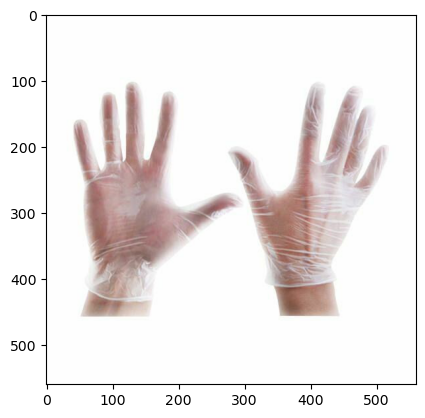

Working with image: gants-vinyle-naturel-micro-poudres-taille-s-6-7-par-100.jpg


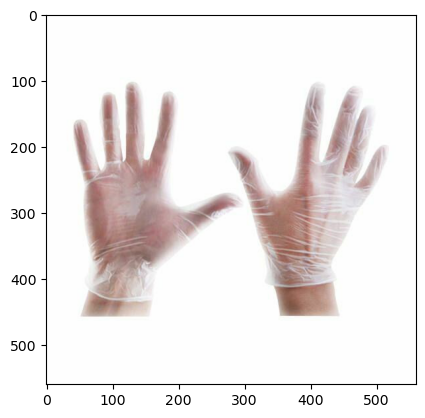

Working with image: gants-nitrile-bleus-non-poudres-taille-xl-9-10-par-100.jpg


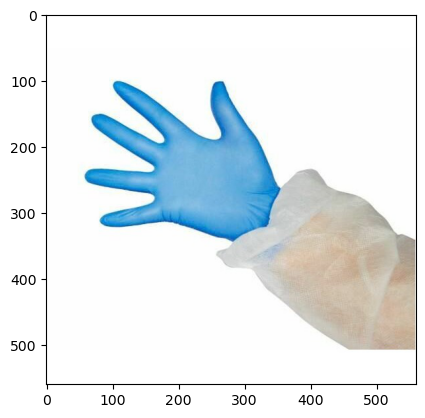

Working with image: gants-nitrile-bleus-non-poudres-taille-s-6-7-par-100.jpg


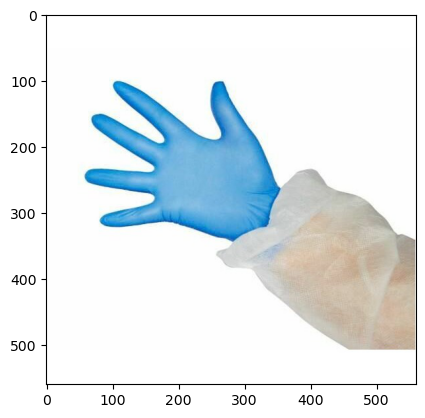

Working with image: gants-nitrile-bleus-non-poudres-taille-m-7-8-par-100.jpg


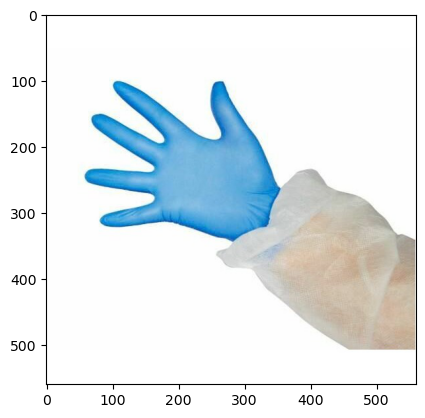

Working with image: gants-nitrile-bleus-non-poudres-taille-l-8-9-par-100.jpg


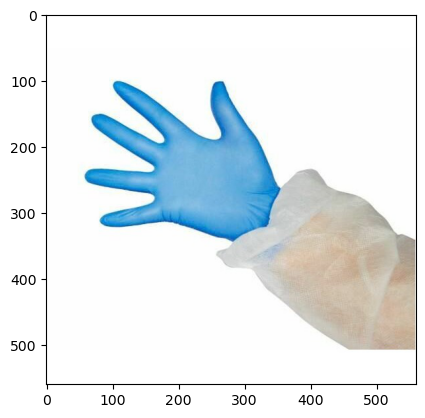

Working with image: etui-a-wrap-kraft-brun-305-x-118-x-4-cm-par-500.jpg


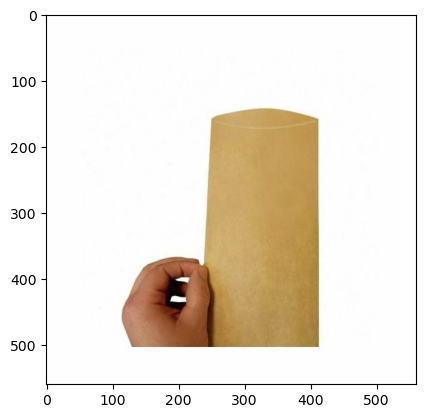

Working with image: emballage-frites-papier-magic-bag-par-250.jpg


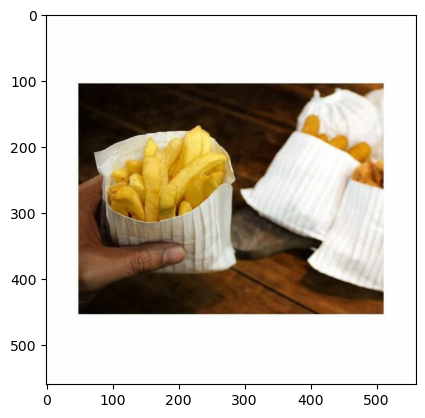

Working with image: distributeur-essuie-mains-enchevetre-a-l-unite.jpg


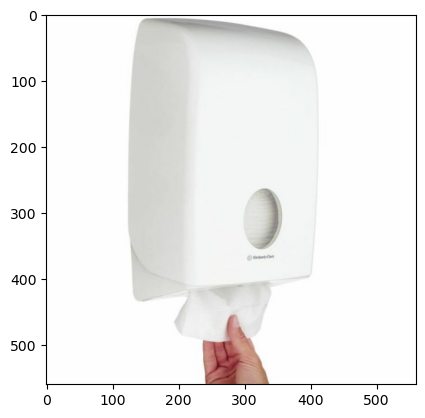

Working with image: distributeur-bobine-papier-portable-wypall-a-l-unite.jpg


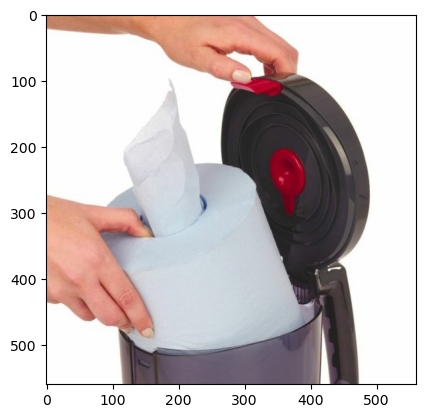

Working with image: distributeur-bobine-papier-portable-wypall-a-l-unite.jpg


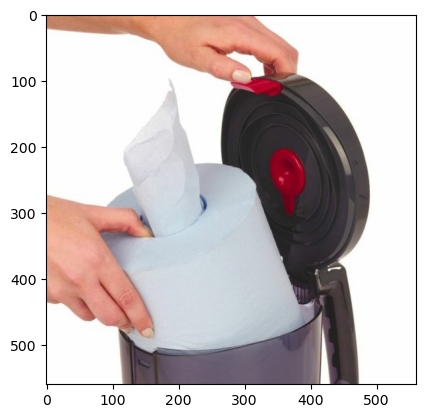

Working with image: couvercle-dome-plastique-transparent-pour-coupe-a-dessert-275-ml-par-50.jpg


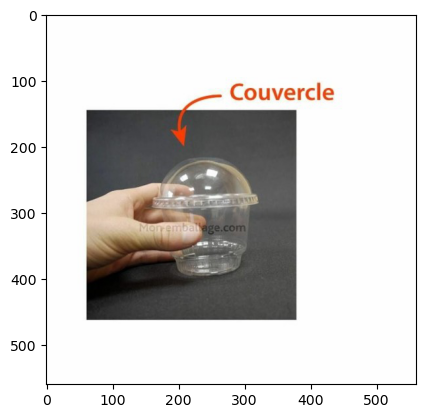

Working with image: charlotte-jetable-plastique-noir-par-100.jpg


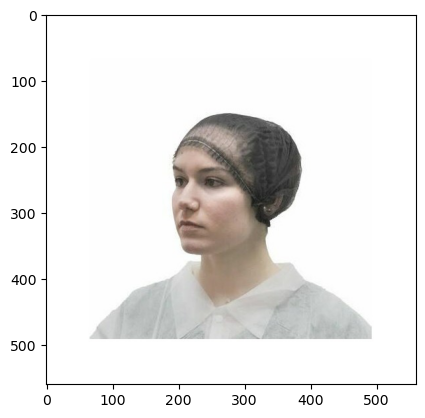

Working with image: charlotte-casquette-blanche-par-100.jpg


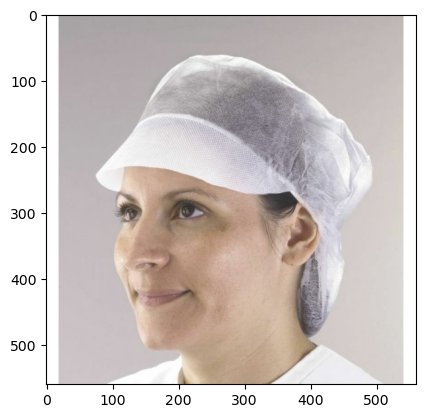

Working with image: charlotte-a-clip-blanche-par-100.jpg


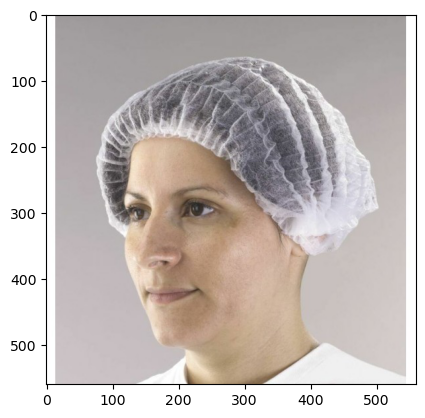

Working with image: caissette-plissee-ronde-blanche-53-x-32-cm-n10-bis-par-1000.jpg


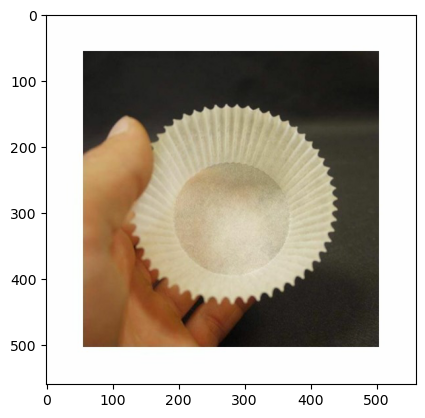

Working with image: caissette-plissee-ronde-blanche-25-x-18-cm-n4-par-1000.jpg


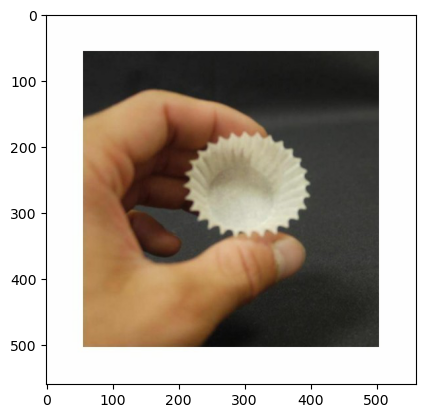

Working with image: caissette-plissee-ovale-brune-105-x-4-x-25-cm-n88-par-1000.jpg


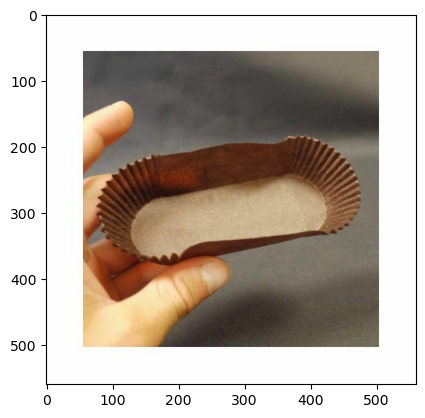

Working with image: caissette-plissee-ovale-brune-105-x-4-x-25-cm-n88-par-1000.jpg


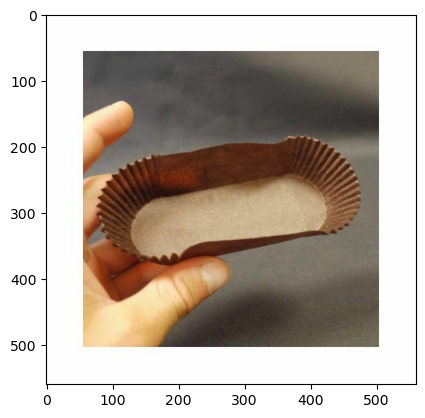

Working with image: caissette-plissee-ovale-blanche-105-x-4-x-25-cm-n88-par-1000.jpg


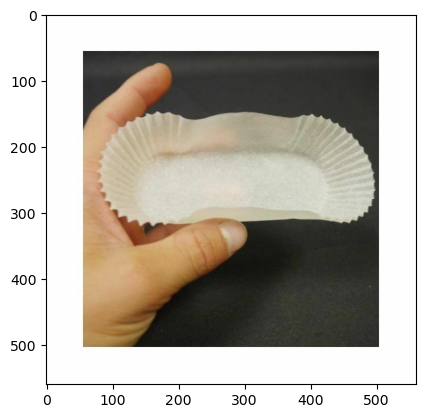

Working with image: caissette-plissee-blanche-28-x-2-cm-n5-par-1000.jpg


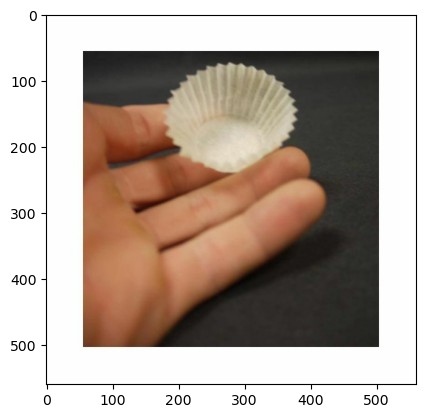

Working with image: bol-salade-plastique-transparent-a-couvercle-dechirable-750-ml-par-200.jpg


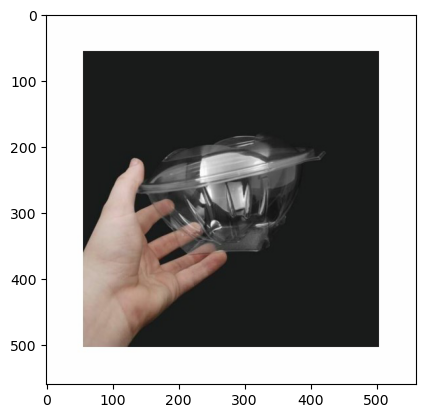

Working with image: boite-traiteur-carton-micro-cannelures-blanche-42-x-28-x-6-cm-par-25.jpg


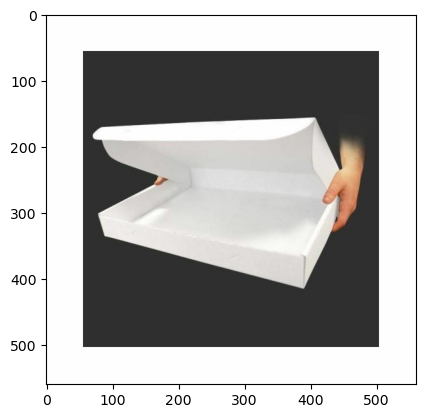

Working with image: boite-traiteur-carton-micro-cannelures-blanche-42-x-28-x-6-cm-par-25.jpg


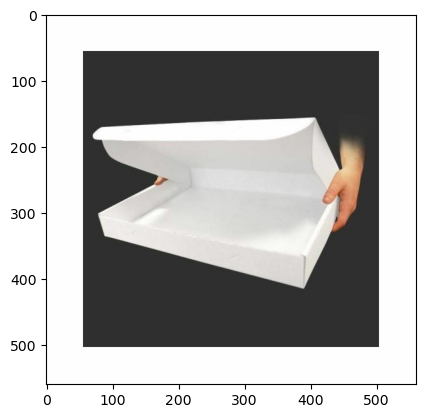

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-750-ml-par-200.jpg


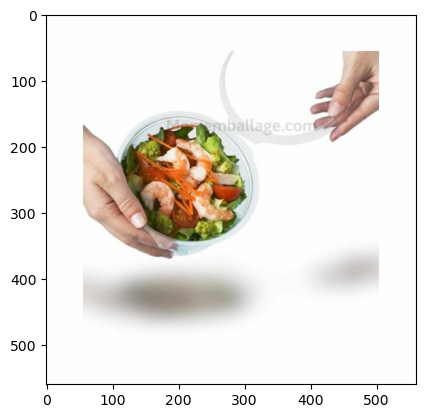

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-750-ml-par-200.jpg


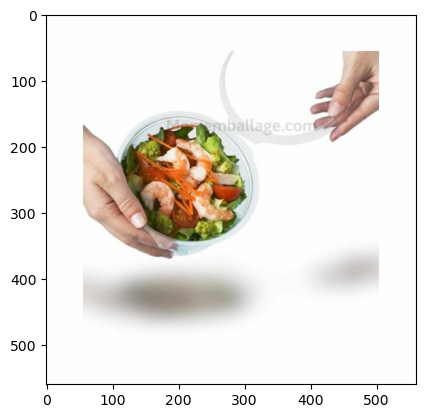

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-500-ml-par-480.jpg


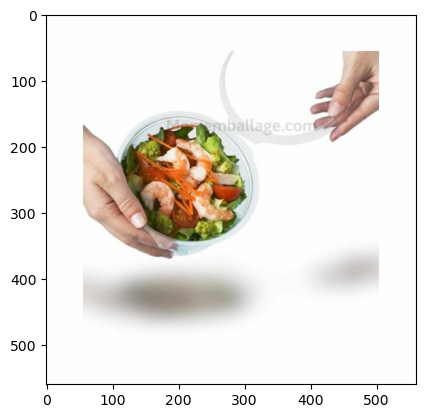

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-500-ml-par-480.jpg


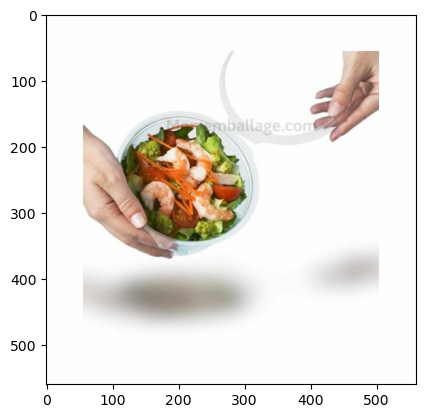

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-250-ml-par-480.jpg


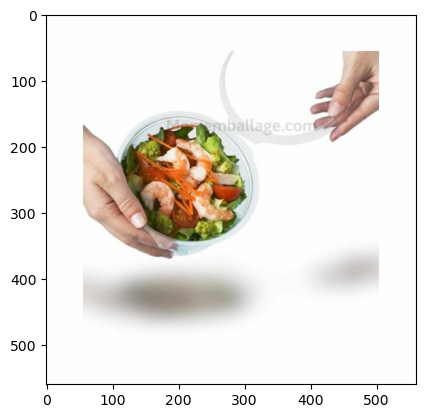

Working with image: boite-ronde-plastique-transparente-avec-couvercle-olipack-250-ml-par-480.jpg


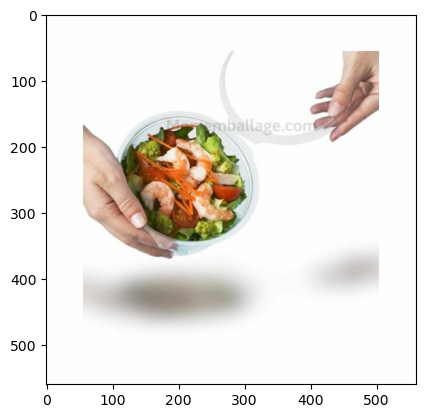

Working with image: boite-prestipack-transparente-600-ml-avec-couvercle-par-30.jpg


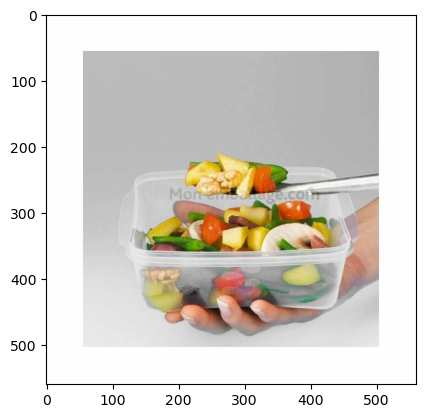

Working with image: boite-prestipack-transparente-600-ml-avec-couvercle-par-30.jpg


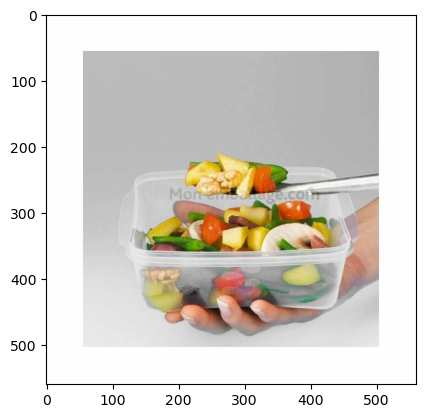

Working with image: boite-noire-pour-sushi-quadripack-17-x-105-cm-avec-couvercle-par-25.jpg


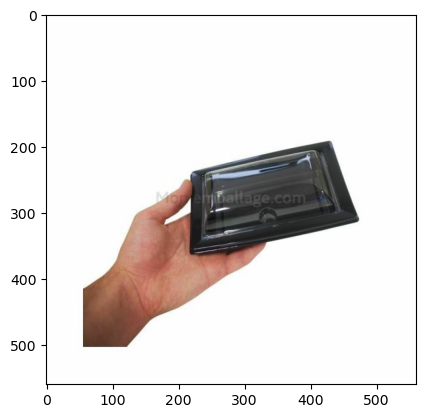

Working with image: blouse-jetable-blanche-par-100.jpg


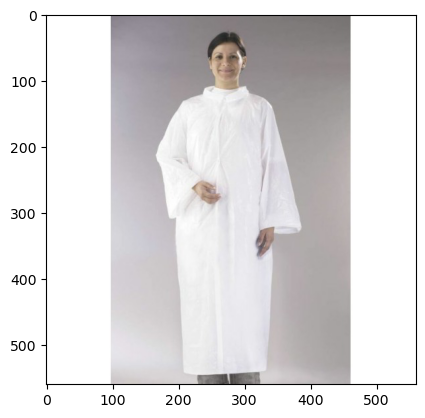

Working with image: blouse-jetable-blanche-par-100.jpg


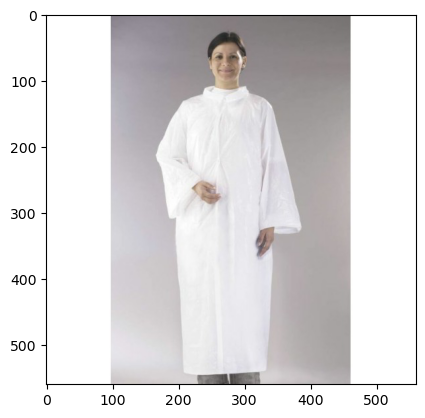

Working with image: blouse-jetable-blanche-par-100.jpg


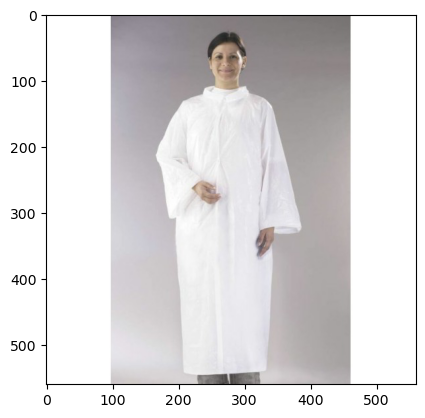

Working with image: barquette-plastique-transparente-scellable-750-ml-par-100.jpg


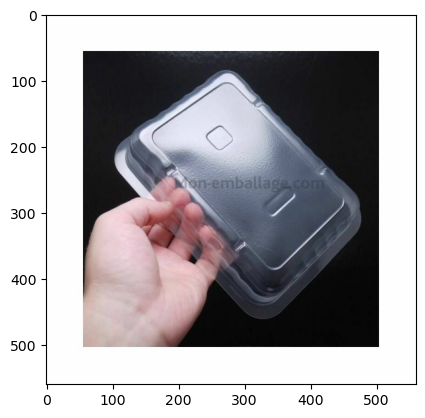

Working with image: barquette-plastique-transparente-scellable-500-ml-par-100.jpg


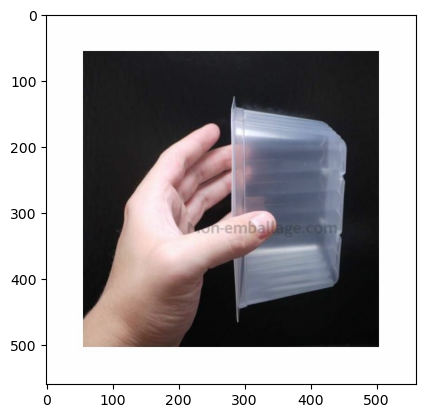

Working with image: barquette-plastique-transparente-scellable-375-ml-par-100.jpg


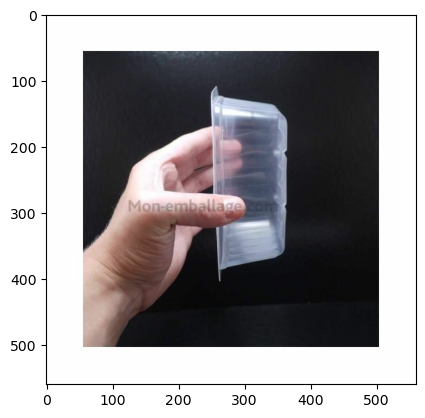

Working with image: barquette-plastique-transparente-scellable-1500-ml-par-100.jpg


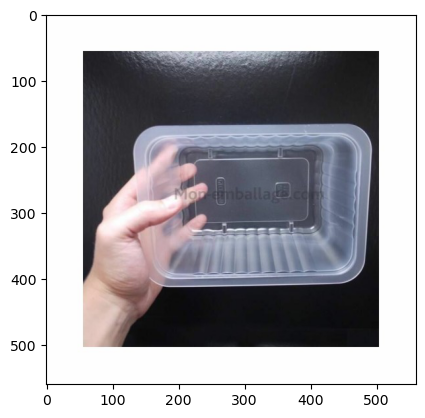

Working with image: barquette-plastique-transparente-scellable-1000-ml-par-100.jpg


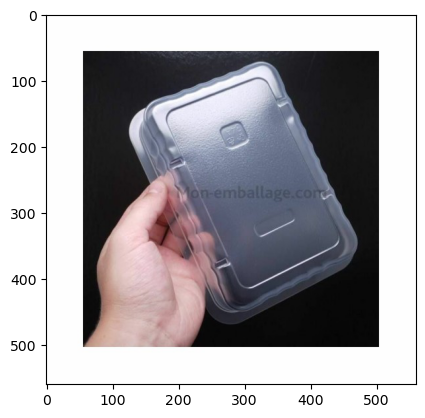

Working with image: barquette-plastique-transparente-avec-couvercle-attenant-standipack-750-ml-par-400.jpg


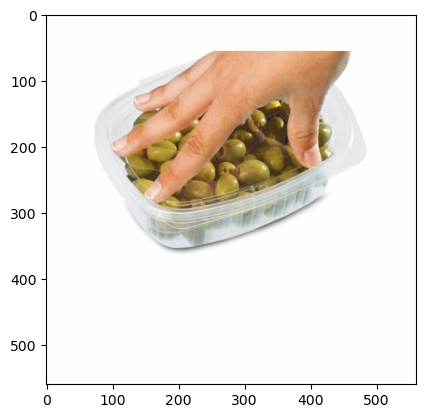

Working with image: barquette-plastique-transparente-avec-couvercle-attenant-standipack-500-ml-par-500.jpg


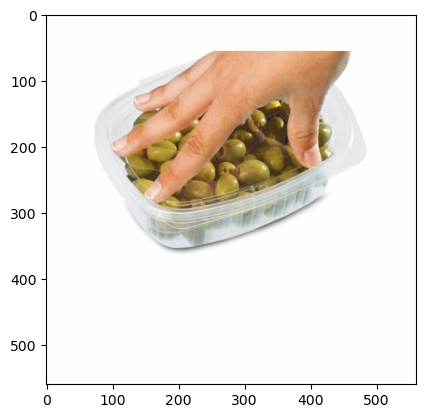

Working with image: barquette-plastique-transparente-avec-couvercle-attenant-standipack-250-ml-par-800.jpg


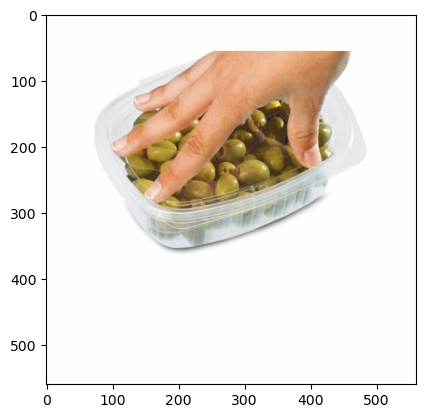

Working with image: barquette-plastique-noire-scellable-500-ml-par-100.jpg


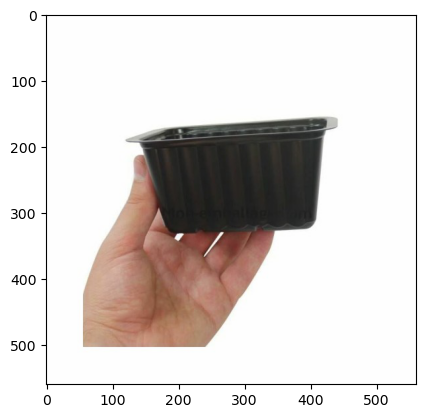

Working with image: barquette-plastique-noire-scellable-1000-ml-par-100.jpg


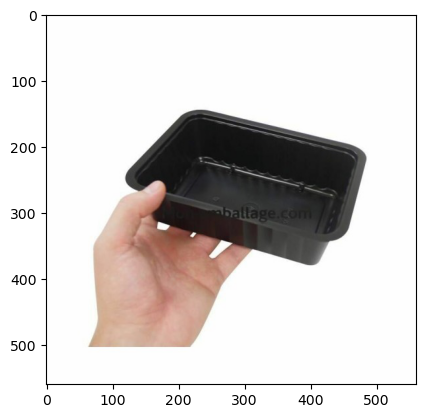

Working with image: barquette-plastique-charcutiere-750-ml-par-250.jpg


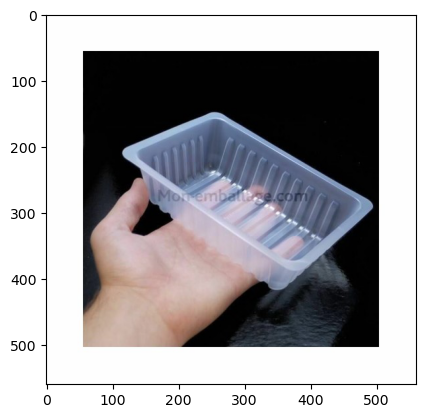

Working with image: barquette-plastique-charcutiere-75-ml-par-500.jpg


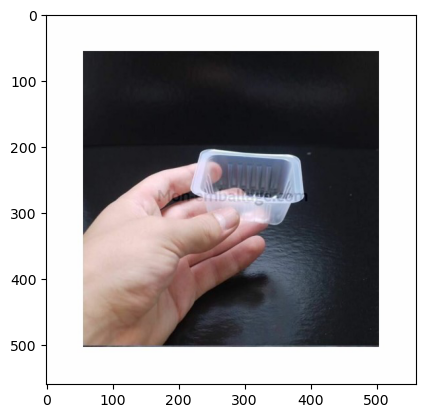

Working with image: barquette-plastique-charcutiere-500-ml-par-250.jpg


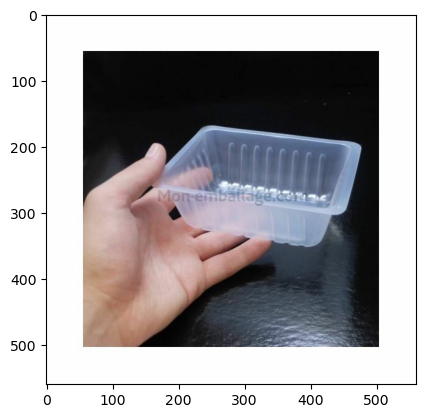

Working with image: barquette-plastique-charcutiere-375-ml-par-250.jpg


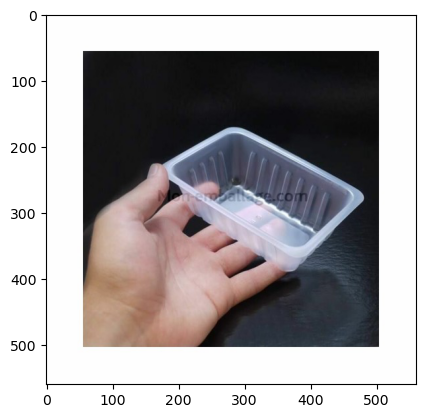

Working with image: barquette-plastique-charcutiere-250-ml-par-500.jpg


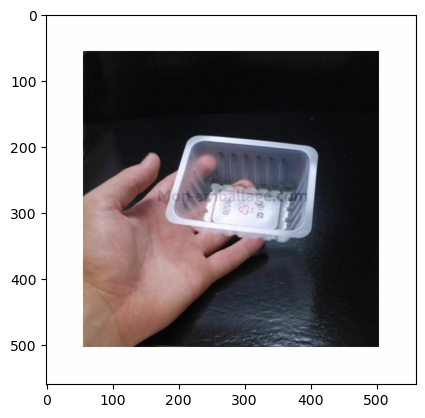

Working with image: barquette-plastique-charcutiere-2000-ml-par-250.jpg


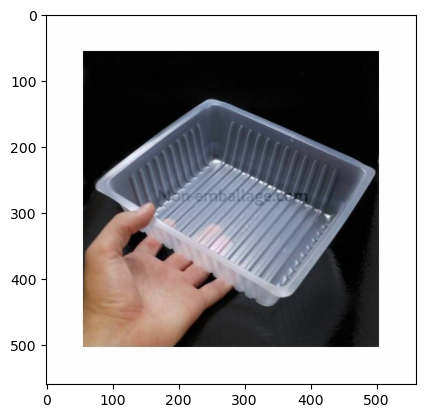

Working with image: barquette-plastique-charcutiere-200-ml-par-500.jpg


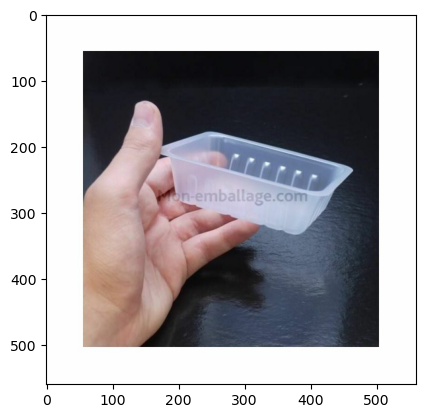

Working with image: barquette-plastique-charcutiere-125-ml-par-500.jpg


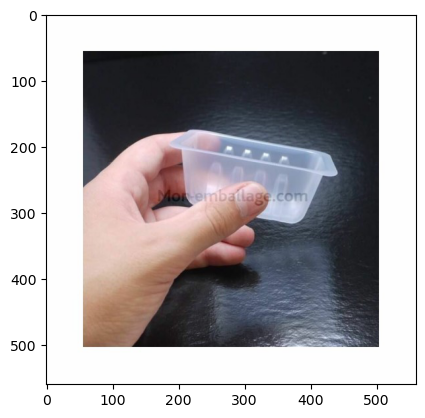

Working with image: barquette-plastique-charcutiere-1000-ml-par-250.jpg


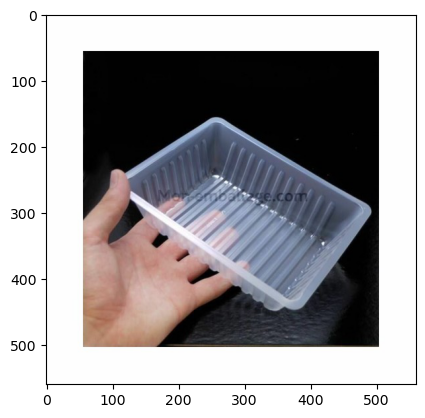

Working with image: barquette-plastique-blanche-avec-couvercle-750-ml-par-200.jpg


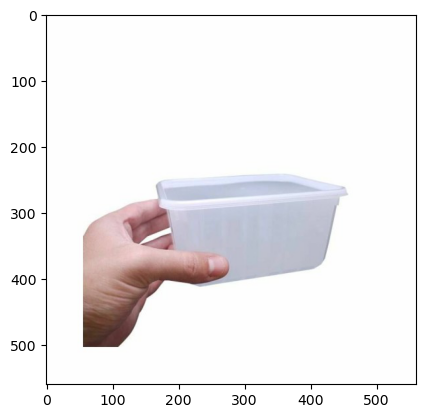

Working with image: barquette-plastique-blanche-avec-couvercle-450-ml-par-200.jpg


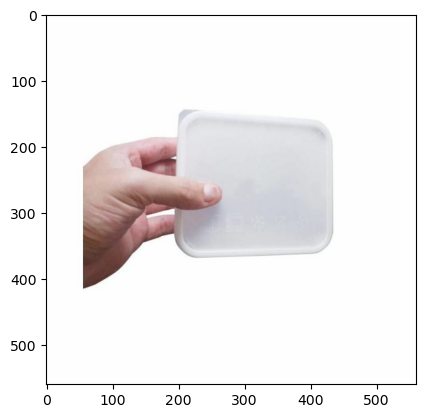

In [ ]:
def plot_img(img, title=None):
  if title:
    plt.title(title)
  plt.imshow(img)
  plt.show()

for filename in filenames:
  img = load_img(filename)
  print('Working with image:', filename)
  plot_img(img)

# CV2 functions

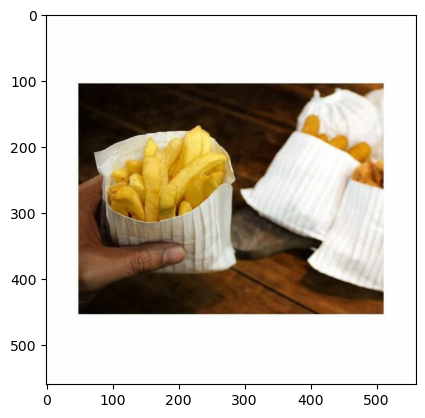

In [7]:
test_file = filenames[41]
test_img = load_img(test_file)
plot_img(test_img)

## Human skin detection

We will use color segmentation techniques such as YCrCb color space thresholding and adaptive histogram-based skin detection to identify human skin regions.

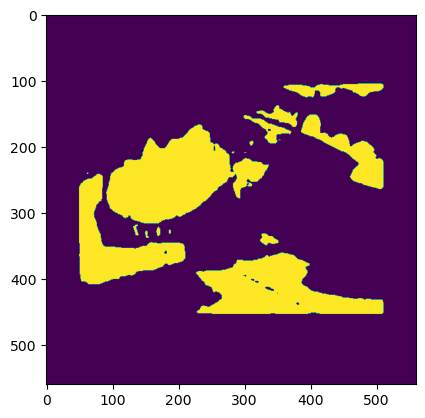

In [8]:
# YCrCb color thresholding
def skin_detect_YCrCb(img):
  img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
  y, cr, cb = cv2.split(img_ycrcb)
  cr1 = cv2.GaussianBlur(cr, (5, 5), 0)
  _, skin = cv2.threshold(cr1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  return skin

skin1 = skin_detect_YCrCb(test_img)
plot_img(skin1)

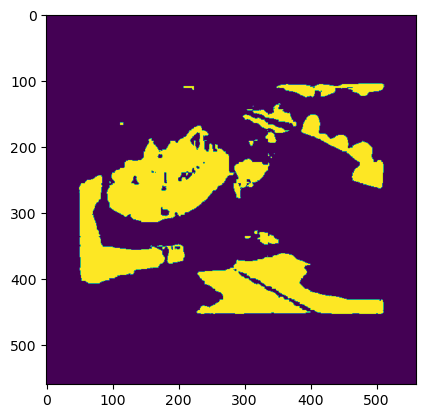

In [9]:
# Adaptive histogram-based
def skin_detect_adaptive(img):
  img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
  y, cr, cb = cv2.split(img_ycrcb)
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
  cl1 = clahe.apply(cr)
  _, skin = cv2.threshold(cl1, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  return skin

skin2 = skin_detect_adaptive(test_img)
plot_img(skin2)

The YCrCb thresholding works decently for skin detection but fails on clothed arms since clothes don't have the same chromatic properties as skin.

Adaptive histogram equalization (CLAHE) on the Cr channel may over-enhance non-skin areas, introducing noise.

Let's try to implement new techniques such as HSV, and combine those techniques together to balance strenghts and weaknesses.



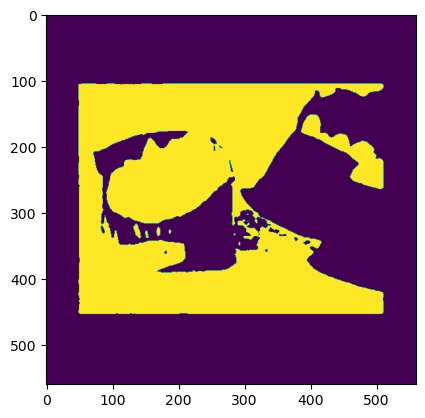

In [10]:
def skin_mask_combined(img):
    """ Detects skin regions using a combination of YCrCb and HSV thresholds. """
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    _, cr, cb = cv2.split(img_ycrcb)
    h, s, v = cv2.split(img_hsv)

    # Thresholds for YCrCb
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_ycrcb = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Adaptive threshold on S channel in HSV
    s_blur = cv2.GaussianBlur(s, (5, 5), 0)
    _, skin_hsv = cv2.threshold(s_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Combine masks
    skin_mask = cv2.bitwise_or(skin_ycrcb, skin_hsv)

    return skin_mask

skin = skin_mask_combined(test_img)
plot_img(skin)

## Edge and Contour Detection

Edge detection (e.g., Canny edge detection) and contour analysis can be applied to refine the segmentation and ensure accurate localization of body parts.

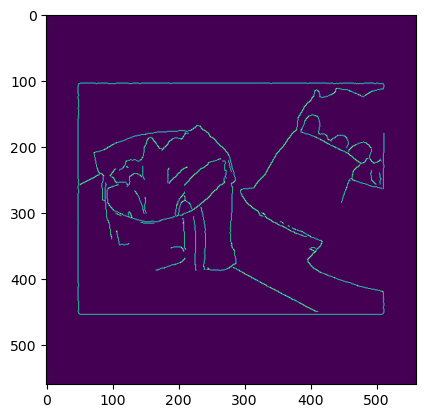

In [11]:
# Canny edge detection
def edge_canny(img):
  img_blur = cv2.GaussianBlur(img, (5, 5), 0)
  edges = cv2.Canny(image=img_blur, threshold1=100, threshold2=200)
  return edges

edges = edge_canny(test_img)
plot_img(edges)

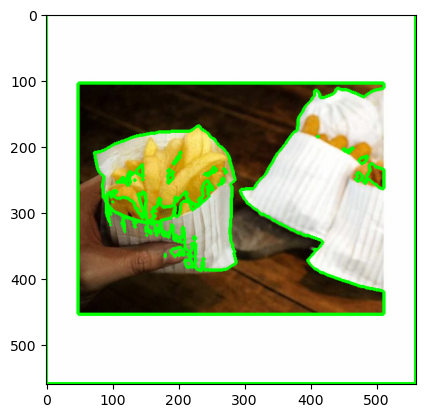

In [12]:
# Contour Analysis
def contour_analysis(img):
  gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  _, thresh = cv2.threshold(gray_img, 127, 255, 0)
  contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  return contours

contours = contour_analysis(test_img)
img_contours = cv2.drawContours(test_img.copy(), contours, -1, (0, 255, 0), 3)
plot_img(img_contours)

--> In our case, edge and contour detection might not be the best methods when used alone.
Instead, it should be used in complement to segmentation masks.

## Morphological Processing

Morphological operations such as dilation and erosion will be employed to remove noise and enhance the segmentation (skin) mask.

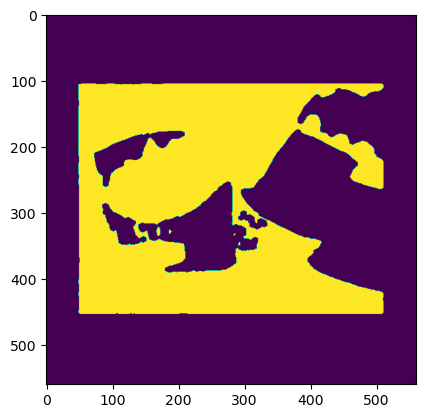

In [13]:
def refine_mask(mask):
    """ Applies morphological operations to clean up the skin mask. """
    kernel_size = 5  # Adaptable based on image size
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))

    # Closing (dilate → erode) to fill gaps
    mask_closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    return mask_closed

img_erode = refine_mask(skin)
plot_img(img_erode)

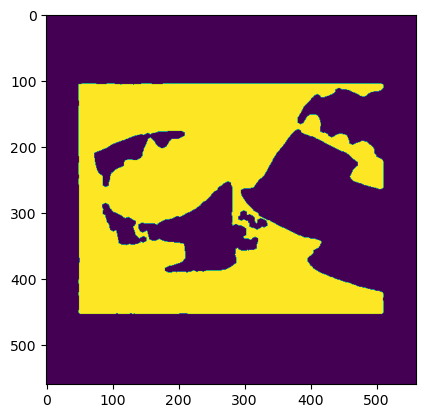

In [14]:
def remove_small_components(mask, min_size=500):
    """ Removes small noise blobs from the mask. """
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)

    # Create a blank mask
    clean_mask = np.zeros_like(mask)

    # Filter by area
    for i in range(1, num_labels):  # Skip background (label 0)
        if stats[i, cv2.CC_STAT_AREA] >= min_size:
            clean_mask[labels == i] = 255

    return clean_mask

img_erode = remove_small_components(img_erode)
plot_img(img_erode)

## Object Recognition for Contextual Analysis

We will utilize template matching or feature-based methods (e.g., ORB, SIFT) to detect and retain objects of interest while removing only human body parts.

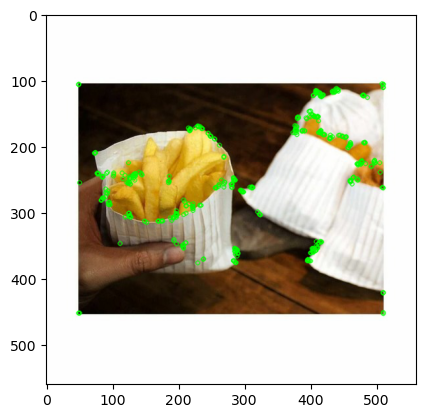

In [15]:
# ORB method
def object_recognition_ORB(img):
  orb = cv2.ORB_create()
  kp = orb.detect(img, None)
  img_kp = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=0)
  return img_kp

img_kp = object_recognition_ORB(test_img)
plot_img(img_kp)

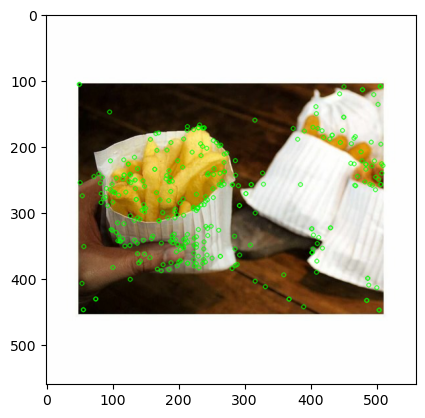

In [16]:
# SIFT method
def object_recognition_SIFT(img):
  sift = cv2.SIFT_create()
  kp = sift.detect(img, None)
  img_kp = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=0)
  return img_kp

img_kp2 = object_recognition_SIFT(test_img)
plot_img(img_kp2)

Those methods seems to detect keypoints for both the body part AND the object... It is too difficult to use those results, so we keep segmentation masks instead.

## Image Inpainting

To reconstruct the occluded background, we will implement non-learning-based inpainting techniques such as exemplar-based inpainting (e.g., Telea’s method or Criminisi’s algorithm).

This approach builds upon prior work in skin detection, object segmentation, and image inpainting but aims to develop an end-to-end pipeline specifically for human body part removal.

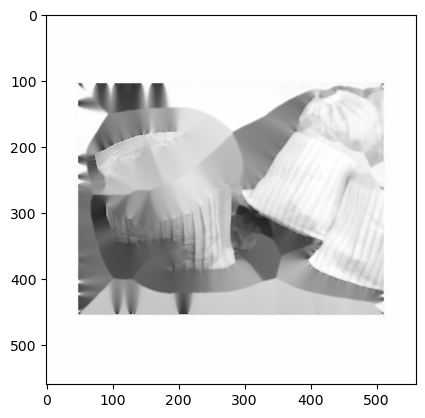

In [17]:
def inpaint_human_parts(img, mask):
    """ Inpaints the detected human parts using the mask. """
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Inpainting needs grayscale images, so convert input image accordingly
    img_inpaint = cv2.inpaint(img_gray, mask, 3, cv2.INPAINT_TELEA) #INPAINT_TS

    # Convert back to RGB (assuming original input is RGB)
    img_inpaint = cv2.cvtColor(img_inpaint, cv2.COLOR_GRAY2RGB)

    return img_inpaint

img_inpaint = inpaint_human_parts(test_img, img_erode)
plot_img(img_inpaint)

## Evaluation

In [18]:
def evaluate(img, img_inpaint):
  pass

# Final pipeline

Improve segmentation on clothed arms by incorporating texture analysis (e.g., Local Binary Patterns).
Use GrabCut segmentation to improve object-background separation.
Experiment with seam carving for better removal in some cases.

In [19]:
def remove_human_parts(img):
    """ Pipeline for removing human body parts. """
    skin_mask = skin_mask_combined(img)
    skin_mask_refined = refine_mask(skin_mask)
    skin_mask_clean = remove_small_components(skin_mask_refined)

    img_inpainted = inpaint_human_parts(img, skin_mask_clean)

    return img_inpainted, skin_mask_clean

Processing: sac-cabas-traiteur-plastique-avec-renfort-de-fond-22-x-21-x-28-cm-par-25.jpg


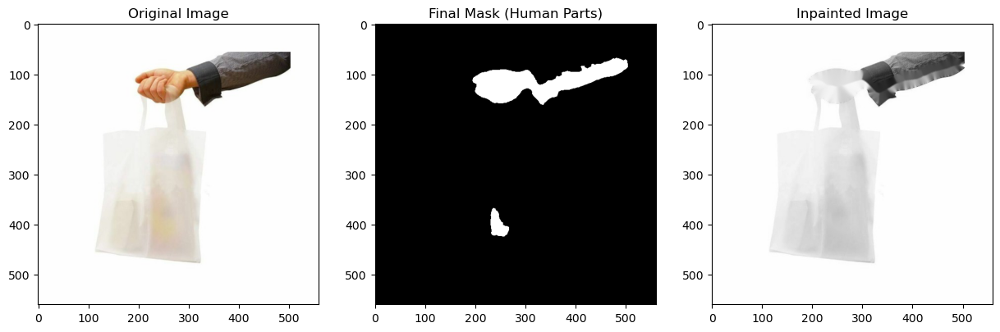

In [20]:
# Test on an image
test_file = filenames[60]
test_img = load_img(test_file)

print("Processing:", test_file)
img_inpainted, final_mask = remove_human_parts(test_img)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
ax1, ax2, ax3 = axes.ravel()
ax1.imshow(test_img)
ax1.set_title("Original Image")
ax2.imshow(final_mask, cmap="gray")
ax2.set_title("Final Mask (Human Parts)")
ax3.imshow(img_inpainted)
ax3.set_title("Inpainted Image")
plt.show()

# Prompted improvements

### v1

fails when two backgrounds in one image : filenames[30]

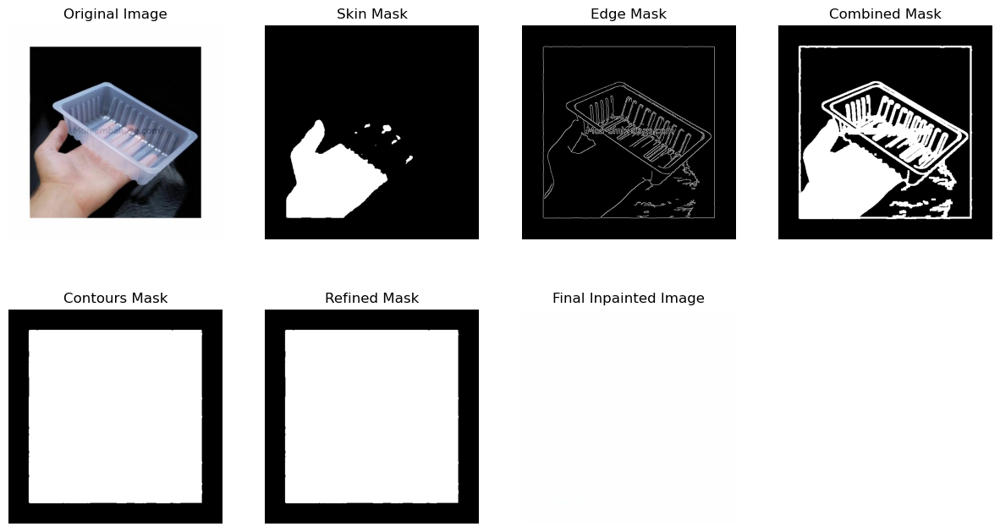

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

# Step 1: Skin Detection
def skin_detect(img):
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return skin_mask

# Step 2: Edge Detection
def edge_detection(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)
    return edges

# Step 3: Smarter Combination of Skin & Edge Masks
def combine_masks(skin_mask, edge_mask):
    combined_mask = cv2.bitwise_or(skin_mask, edge_mask)
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=1)
    return combined_mask

# Step 4: Extract Human Contours with Improved Filtering
def extract_human_contours(mask, min_area=5000):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    return filtered_contours

# Step 5: Create Mask from Contours
def create_mask(img, contours):
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    return mask

# Step 6: Refine Mask using GrabCut
def refine_mask_with_grabcut(img, mask):
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    mask_grabcut = np.where(mask == 255, cv2.GC_FGD, cv2.GC_BGD).astype('uint8')
    cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)
    refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')
    return refined_mask

# Step 7: Inpainting
def inpaint_image(img, mask):
    return cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Full Pipeline with Debugging
def remove_human_parts_with_visualization(img):
    skin_mask = skin_detect(img)
    edges = edge_detection(img)
    combined_mask = combine_masks(skin_mask, edges)
    contours = extract_human_contours(combined_mask)
    if not contours:
        print("No human body parts detected.")
        return img
    human_mask = create_mask(img, contours)
    refined_mask = refine_mask_with_grabcut(img, human_mask)
    img_final = inpaint_image(img, refined_mask)

    # Visualization
    show_images([
        img, skin_mask, edges, combined_mask, human_mask, refined_mask, img_final
    ], [
        "Original Image", "Skin Mask", "Edge Mask", "Combined Mask", "Contours Mask", "Refined Mask", "Final Inpainted Image"
    ], cmap='gray')

    return img_final

# Load an image and apply the pipeline
test_img = load_img(filenames[10])  # Replace with actual image
result_img = remove_human_parts_with_visualization(test_img)

### v2

fix the two backgrounds issue

In [24]:
def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 12))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(3, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

# Step 1: Skin Detection
def skin_detect(img):
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return skin_mask

# Step 2: Edge Detection
def edge_detection(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)
    return edges

# Step 3: Smarter Combination of Skin & Edge Masks
def combine_masks(skin_mask, edge_mask):
    combined_mask = cv2.bitwise_or(skin_mask, edge_mask)
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=1)
    return combined_mask

# Step 4: Extract Human Contours with Improved Filtering
def extract_human_contours(mask, min_area=100):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    return filtered_contours

# Step 5: Create Mask from Contours
def create_mask(img, contours):
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    return mask

# Step 6: Refine Mask using GrabCut
def refine_mask_with_grabcut(img, mask):
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    mask_grabcut = np.where(mask == 255, cv2.GC_FGD, cv2.GC_BGD).astype('uint8')

    #mask_grabcut[mask_grabcut == cv2.GC_BGD] = cv2.GC_PR_BGD
    #mask_grabcut[mask_grabcut == cv2.GC_FGD] = cv2.GC_PR_FGD

    cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)

    refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')

    return refined_mask

# Step 7: Inpainting
def inpaint_image(img, mask):
    return cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Step 8: Detect Double Background
def detect_double_background(img, threshold=50):
    # Convert image to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Threshold to find the uniform background color
    _, bg_mask = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_BINARY)
    return bg_mask

# Step 9: Exclude Double Background for Edge Detection
def filter_edges_with_background(img, edge_mask):
    # Detect the background using color thresholding
    double_bg_mask = detect_double_background(img)

    # Combine edge mask and double background mask to exclude the background in the edge detection
    combined_mask = cv2.bitwise_and(edge_mask, cv2.bitwise_not(double_bg_mask))

    return combined_mask

def compute_iou(refined_mask, filenumber, filename):
    """
    Compute the Intersection over Union (IoU) between the refined mask and ground truth.
    
    Parameters:
    - refined_mask: The predicted mask from the algorithm
    - filenumber: Index to identify which ground truth to use
    
    Returns:
    - IoU score between 0 and 1
    """
    # Get ground truth mask
    gt_mask = get_ground_truth_mask(filenumber, filename)
    
    # Ensure both masks are binary (0 or 255)
    refined_binary = (refined_mask > 0).astype(np.uint8)
    gt_binary = (gt_mask > 0).astype(np.uint8)
    
    # Calculate intersection and union
    intersection = np.logical_and(refined_binary, gt_binary).sum()
    union = np.logical_or(refined_binary, gt_binary).sum()
    
    # Avoid division by zero
    if union == 0:
        return 0.0
    
    # Return IoU score
    return intersection / union

def get_ground_truth_mask(filenumber, filename):
    """
    Create a mask from the ground truth polygon coordinates in the dataframe.
    
    Parameters:
    - filenumber: Index to identify which ground truth to use
    
    Returns:
    - Binary mask representing the ground truth
    """
    number_regions = df_filenames.loc[filenumber, 'region_count']

    # Access the dataframe to get polygon coordinates
    # Assuming df is your pandas dataframe with the polygon coordinates
    x_points = df_poly.loc[df_poly['filenumber'] == filenumber, 'all_points_x'].tolist()
    y_points = df_poly.loc[df_poly['filenumber'] == filenumber, 'all_points_y'].tolist()
    
    # Create a list of points from x and y coordinates
    points = []
    for i in range(number_regions):
        points.append(np.column_stack((x_points[i], y_points[i])).astype(np.int32))
    
    # Create an empty mask with the same size as the image
    # You may need to adjust this based on your actual image size
    # Assuming your original image shape is available in a variable or can be derived
    # If not available directly, you could use the shape of refined_mask from compute_iou function
    mask_shape = load_img(filename).shape[:2]
    
    # Alternative approach if you have access to the test_img variable
    # mask_shape = test_img.shape[:2]
    
    gt_mask = np.zeros(mask_shape, dtype=np.uint8)
    
    # Fill the polygon on the mask
    for i in range(number_regions):
        cv2.fillPoly(gt_mask, [points[i]], 255)
    
    return gt_mask

# Full Pipeline with Debugging
def remove_human_parts_with_visualization(img, filenumber, filename):

    # Skin detection
    skin_mask = skin_detect(img)

    # Edge detection (after filtering background edges)
    edges = edge_detection(img)
    filtered_edges = filter_edges_with_background(img, edges)

    # Combine masks
    combined_mask = combine_masks(skin_mask, filtered_edges)

    # Extract human contours
    contours = extract_human_contours(combined_mask)

    if not contours:
        print("No human body parts detected.")
        return img

    human_mask = create_mask(img, contours)

    # Refine mask using GrabCut
    refined_mask = refine_mask_with_grabcut(img, human_mask)

    print("IoU: ", compute_iou(refined_mask, filenumber, filename))

    ground_truth_mask = get_ground_truth_mask(filenumber, filename)

    # Inpainting
    img_final = inpaint_image(img, refined_mask)

    # Visualization
    show_images([
        img, skin_mask, edges, filtered_edges, 
        combined_mask, human_mask, refined_mask, ground_truth_mask, 
        img_final
    ], [
        "Og Image", "Skin Mask", "Edge Mask", "Filtered Edge Mask", 
        "Combined Mask", "Contours Mask", "Refined Mask", "Ground Truth", 
        "Final Inpainted Image"
    ], cmap='gray')

    return img_final

# Load an image and apply the pipeline
filenumber = 68
filename = df_filenames.loc[filenumber, 'filename']
test_img = load_img('manchette-elastiquee-plastique-opaque-blanc-20-x-40-cm-par-100.jpg')
result_img = remove_human_parts_with_visualization(test_img, filenumber, filename)


error: OpenCV(4.10.0) C:\b\abs_daut97tdpo\croot\opencv-suite_1722029138522\work\modules\imgproc\src\grabcut.cpp:386: error: (-215:Assertion failed) !bgdSamples.empty() && !fgdSamples.empty() in function 'initGMMs'


### Hybrid hand detection

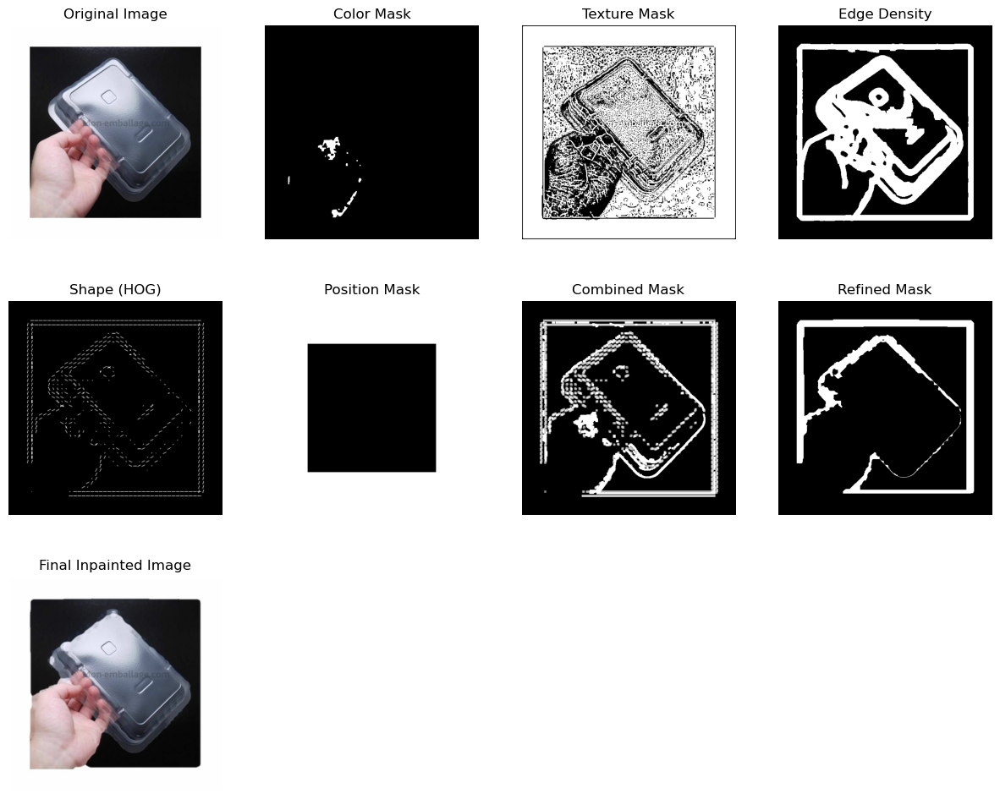

In [113]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern, hog

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 12))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(3, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

# 1. Multiple Color Space Skin Detection
def multi_color_skin_detect(img):
    # Original YCrCb method
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, ycrcb_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # HSV method
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    lower_hsv = np.array([0, 20, 70], dtype=np.uint8)
    upper_hsv = np.array([20, 150, 255], dtype=np.uint8)
    hsv_mask = cv2.inRange(img_hsv, lower_hsv, upper_hsv)
    
    # RGB normalized ratio method
    img_rgb = img.copy()
    r, g, b = cv2.split(img_rgb)
    r = r.astype(float)
    g = g.astype(float)
    b = b.astype(float)
    
    # Avoid division by zero
    epsilon = 1e-6
    sum_rgb = r + g + b + epsilon
    r_norm = r / sum_rgb
    g_norm = g / sum_rgb
    
    skin_r_g = (r_norm > 0.4) & (g_norm < 0.4)
    skin_r_b = (r > b)
    rgb_mask = np.logical_and(skin_r_g, skin_r_b).astype(np.uint8) * 255
    
    # Combine masks - more conservative approach with AND operation
    combined_mask = cv2.bitwise_and(ycrcb_mask, hsv_mask)
    combined_mask = cv2.bitwise_and(combined_mask, rgb_mask)
    
    # Optional: Apply morphological operations to clean up the mask
    kernel = np.ones((3, 3), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    
    return combined_mask

# 2. Texture-Based Analysis using LBP
def texture_analysis(img):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Calculate LBP
    radius = 3
    n_points = 8 * radius
    lbp = local_binary_pattern(gray, n_points, radius, method='uniform')
    
    # Normalize LBP image
    lbp = (lbp - lbp.min()) / (lbp.max() - lbp.min() + 1e-8) * 255
    lbp = lbp.astype(np.uint8)
    
    # Threshold LBP to identify skin texture
    # This requires tuning based on your specific dataset
    _, lbp_mask = cv2.threshold(lbp, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    return lbp_mask

# 3. Edge Density Analysis
def edge_density_analysis(img):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Calculate edge using Canny
    edges = cv2.Canny(gray, 50, 150)
    
    # Calculate edge density in local regions
    kernel_size = 15
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    edge_density = cv2.filter2D(edges, -1, kernel / (kernel_size * kernel_size))
    
    # Threshold density to identify high-density regions (likely hands)
    _, edge_density_mask = cv2.threshold(edge_density, 10, 255, cv2.THRESH_BINARY)
    
    return edge_density_mask

# 4. Shape Analysis using HOG
def shape_analysis(img):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Calculate HOG features
    h, w = gray.shape
    # Resize if necessary to speed up HOG computation
    scale = 1
    if h > 400 or w > 400:
        scale = 400 / max(h, w)
        gray = cv2.resize(gray, (int(w * scale), int(h * scale)))
    
    hog_features, hog_image = hog(
        gray, 
        orientations=9, 
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2), 
        visualize=True, 
        block_norm='L2-Hys'
    )
    
    # Normalize HOG image
    hog_image = (hog_image - hog_image.min()) / (hog_image.max() - hog_image.min() + 1e-8) * 255
    hog_image = hog_image.astype(np.uint8)
    
    # Threshold HOG to identify hand-like shapes
    _, hog_mask = cv2.threshold(hog_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Resize back to original size if scaled
    if scale != 1:
        hog_mask = cv2.resize(hog_mask, (w, h))
    
    return hog_mask

# 5. Position Context Analysis
def position_context(img, margin_percent=0.2):
    h, w = img.shape[:2]
    margin_h = int(h * margin_percent)
    margin_w = int(w * margin_percent)
    
    # Create a mask with higher weights for the edges
    position_mask = np.zeros((h, w), dtype=np.uint8)
    # Top edge
    position_mask[:margin_h, :] = 255
    # Bottom edge
    position_mask[h-margin_h:, :] = 255
    # Left edge
    position_mask[:, :margin_w] = 255
    # Right edge
    position_mask[:, w-margin_w:] = 255
    
    return position_mask

# Original functions from your code
def edge_detection(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)
    return edges

def detect_double_background(img, threshold=50):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    _, bg_mask = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_BINARY)
    return bg_mask

def filter_edges_with_background(img, edge_mask):
    double_bg_mask = detect_double_background(img)
    combined_mask = cv2.bitwise_and(edge_mask, cv2.bitwise_not(double_bg_mask))
    return combined_mask

def extract_human_contours(mask, min_area=5000):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    return filtered_contours

def create_mask(img, contours):
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    return mask

def refine_mask_with_grabcut(img, mask):
    # Create a slightly dilated and eroded version of the mask to ensure we have
    # both foreground and background samples
    kernel = np.ones((5, 5), np.uint8)
    dilated_mask = cv2.dilate(mask, kernel, iterations=1)
    eroded_mask = cv2.erode(mask, kernel, iterations=1)
    
    # Initialize the mask for GrabCut
    mask_grabcut = np.ones(mask.shape, np.uint8) * cv2.GC_PR_BGD  # Initialize everything as probable background
    
    # Set probable foreground and background
    mask_grabcut[eroded_mask == 255] = cv2.GC_FGD  # Definitely foreground
    mask_grabcut[dilated_mask == 0] = cv2.GC_BGD  # Definitely background
    
    # Border area between eroded and dilated is uncertain
    uncertain_area = np.logical_and(dilated_mask == 255, eroded_mask == 0)
    mask_grabcut[uncertain_area] = cv2.GC_PR_FGD  # Probably foreground
    
    # Check if we have both foreground and background samples
    if np.sum(mask_grabcut == cv2.GC_FGD) == 0 or np.sum(mask_grabcut == cv2.GC_BGD) == 0:
        # If not, create a simple foreground/background separation
        h, w = mask.shape
        # Force some foreground at the center if none exists
        if np.sum(mask_grabcut == cv2.GC_FGD) == 0:
            center_y, center_x = h // 2, w // 2
            mask_grabcut[center_y-10:center_y+10, center_x-10:center_x+10] = cv2.GC_FGD
        
        # Force some background at the borders if none exists
        if np.sum(mask_grabcut == cv2.GC_BGD) == 0:
            border_width = 10
            mask_grabcut[:border_width, :] = cv2.GC_BGD  # Top border
            mask_grabcut[-border_width:, :] = cv2.GC_BGD  # Bottom border
            mask_grabcut[:, :border_width] = cv2.GC_BGD  # Left border
            mask_grabcut[:, -border_width:] = cv2.GC_BGD  # Right border
    
    # Initialize GMM models
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    
    # Run GrabCut algorithm
    try:
        cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)
        # Create the final mask
        refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')
    except cv2.error:
        # If GrabCut still fails, fallback to the original mask
        print("GrabCut failed, falling back to original mask")
        refined_mask = mask
    
    return refined_mask

# Keep the inpainting function as requested
def inpaint_image(img, mask):
    return cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# New combined hybrid approach
def hybrid_combine_masks(img):
    # Multi-color space skin detection
    color_mask = multi_color_skin_detect(img)
    
    # Texture-based analysis
    texture_mask = texture_analysis(img)
    
    # Edge density analysis
    edge_density_mask = edge_density_analysis(img)
    
    # Shape analysis
    shape_mask = shape_analysis(img)
    
    # Position context (with lower weight)
    position_mask = position_context(img)
    
    # Edge detection (filtered with background)
    edges = edge_detection(img)
    filtered_edges = filter_edges_with_background(img, edges)
    
    # Combine all masks with weighted approach
    # Core detection: Color + Texture + Edge density
    #core_mask = cv2.bitwise_and(color_mask, texture_mask)
    core_mask = cv2.bitwise_and(color_mask, edge_density_mask)
    
    # Secondary features: Shape + Position + Filtered edges
    secondary_mask = cv2.bitwise_or(shape_mask, filtered_edges)
    # Position has lower weight, so we use it as a boost rather than a strict filter
    #secondary_mask = cv2.bitwise_or(secondary_mask, position_mask)
    
    # Combine core and secondary masks
    combined_mask = cv2.bitwise_or(core_mask, secondary_mask)
    
    # Clean up the mask with morphological operations
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=1)
    
    return combined_mask

# Full improved pipeline with visualization
def remove_human_parts_with_visualization(img):
    # 1. Apply hybrid mask combination
    combined_mask = hybrid_combine_masks(img)
    
    # 2. Extract human contours
    contours = extract_human_contours(combined_mask)
    
    if not contours:
        print("No human body parts detected.")
        return img
    
    # 3. Create mask from contours
    human_mask = create_mask(img, contours)
    
    # 4. Refine mask using GrabCut
    refined_mask = refine_mask_with_grabcut(img, human_mask)
    
    # 5. Inpainting (kept as is)
    img_final = inpaint_image(img, refined_mask)
    
    # Visualization
    # Get individual masks for visualization
    color_mask = multi_color_skin_detect(img)
    texture_mask = texture_analysis(img)
    edge_density_mask = edge_density_analysis(img)
    shape_mask = shape_analysis(img)
    position_mask = position_context(img)
    
    # Create a visualization to show all contributors
    show_images([
        img, color_mask, texture_mask, edge_density_mask, 
        shape_mask, position_mask, combined_mask, refined_mask, img_final
    ], [
        "Original Image", "Color Mask", "Texture Mask", "Edge Density", 
        "Shape (HOG)", "Position Mask", "Combined Mask", "Refined Mask", "Final Inpainted Image"
    ], cmap='gray')
    
    return img_final

# Usage example
test_img = load_img(filenames[20])  # Replace with actual image
result_img = remove_human_parts_with_visualization(test_img)

### SLIC

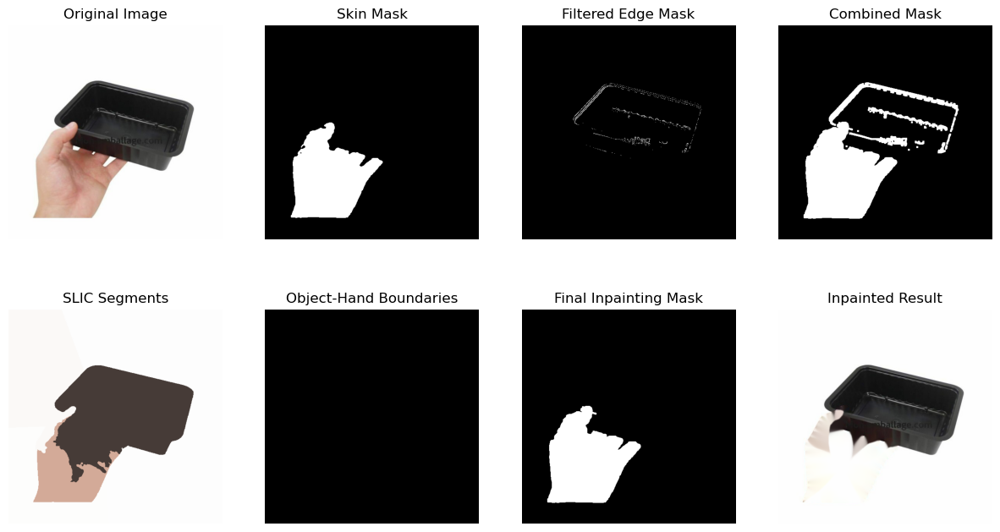

In [99]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from skimage.color import label2rgb
from skimage.util import img_as_float, img_as_ubyte

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

# Step 1: Skin Detection
def skin_detect(img):
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return skin_mask

# Step 2: Edge Detection
def edge_detection(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)
    return edges

# Step 3: Smarter Combination of Skin & Edge Masks
def combine_masks(skin_mask, edge_mask):
    combined_mask = cv2.bitwise_or(skin_mask, edge_mask)
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=1)
    return combined_mask

# Step 4: Extract Human Contours with Improved Filtering
def extract_human_contours(mask, min_area=5000):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    return filtered_contours

# Step 5: Create Mask from Contours
def create_mask(img, contours):
    mask = np.zeros(img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    return mask

# Step 6: Refine Mask using GrabCut
def refine_mask_with_grabcut(img, mask):
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    mask_grabcut = np.where(mask == 255, cv2.GC_FGD, cv2.GC_BGD).astype('uint8')

    cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)

    refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')

    return refined_mask

# Step 7: Inpainting
def inpaint_image(img, mask):
    return cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Step 8: Detect Double Background
def detect_double_background(img, threshold=50):
    # Convert image to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Threshold to find the uniform background color
    _, bg_mask = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_BINARY)
    return bg_mask

# Step 9: Exclude Double Background for Edge Detection
def filter_edges_with_background(img, edge_mask):
    # Detect the background using color thresholding
    double_bg_mask = detect_double_background(img)

    # Combine edge mask and double background mask to exclude the background in the edge detection
    combined_mask = cv2.bitwise_and(edge_mask, cv2.bitwise_not(double_bg_mask))

    return combined_mask

# New Step: SLIC Superpixel Segmentation
def apply_slic_segmentation(img, n_segments=100, compactness=10):
    # Convert to float for SLIC
    img_float = img_as_float(img)
    
    # Apply SLIC
    segments = slic(img_float, n_segments=n_segments, compactness=compactness, sigma=1)
    
    return segments

# New Step: Find Object-Hand Boundaries using SLIC and Skin Detection
def find_object_hand_boundaries(img, segments, skin_mask, refined_mask):
    # Identify which segments belong to skin
    skin_segments = set()
    object_segments = set()
    background_segments = set()
    
    # Convert binary masks to boolean for efficient indexing
    skin_bool = skin_mask > 0
    refined_bool = refined_mask > 0
    
    # Classify each segment as skin, object, or background
    for segment_id in np.unique(segments):
        segment_mask = segments == segment_id
        skin_overlap = np.sum(segment_mask & skin_bool)
        refined_overlap = np.sum(segment_mask & refined_bool)
        
        # Calculate percentage of overlap with skin and refined mask
        segment_size = np.sum(segment_mask)
        skin_ratio = skin_overlap / segment_size
        refined_ratio = refined_overlap / segment_size
        
        # Classify the segment
        if skin_ratio > 0.5 and refined_ratio > 0.5:
            skin_segments.add(segment_id)
        elif refined_ratio <= 0.3:  # Low overlap with refined mask means it's likely background
            background_segments.add(segment_id)
        else:
            object_segments.add(segment_id)
    
    # Create a boundary mask for object-hand boundaries
    boundary_mask = np.zeros_like(skin_mask, dtype=np.uint8)
    
    # Find boundaries between segments
    dx = np.diff(segments, axis=0)
    dy = np.diff(segments, axis=1)
    
    # Convert sets to lists for faster lookup
    skin_segments_list = list(skin_segments)
    object_segments_list = list(object_segments)
    
    # Horizontal boundaries
    for i in range(dx.shape[0]):
        for j in range(dx.shape[1]):
            if dx[i, j] != 0:  # There is a boundary
                s1 = segments[i, j]
                s2 = segments[i+1, j]
                
                # Check if this is a skin-object boundary
                if ((s1 in skin_segments_list and s2 in object_segments_list) or 
                    (s2 in skin_segments_list and s1 in object_segments_list)):
                    boundary_mask[i:i+2, j] = 255
    
    # Vertical boundaries
    for i in range(dy.shape[0]):
        for j in range(dy.shape[1]):
            if dy[i, j] != 0:  # There is a boundary
                s1 = segments[i, j]
                s2 = segments[i, j+1]
                
                # Check if this is a skin-object boundary
                if ((s1 in skin_segments_list and s2 in object_segments_list) or 
                    (s2 in skin_segments_list and s1 in object_segments_list)):
                    boundary_mask[i, j:j+2] = 255
    
    # Dilate boundaries for better visibility
    kernel = np.ones((3, 3), np.uint8)
    boundary_mask = cv2.dilate(boundary_mask, kernel, iterations=1)
    
    return boundary_mask

# Modified Full Pipeline with SLIC Segmentation
def remove_human_parts_with_visualization(img):
    # Skin detection
    skin_mask = skin_detect(img)

    # Edge detection (after filtering background edges)
    edges = edge_detection(img)
    filtered_edges = filter_edges_with_background(img, edges)

    # Combine masks
    combined_mask = combine_masks(skin_mask, filtered_edges)

    # Extract human contours
    contours = extract_human_contours(combined_mask)

    if not contours:
        print("No human body parts detected.")
        return img

    human_mask = create_mask(img, contours)

    # Refine mask using GrabCut
    refined_mask = refine_mask_with_grabcut(img, human_mask)
    
    # Apply SLIC segmentation
    segments = apply_slic_segmentation(img, n_segments=10, compactness=15)
    
    # Generate visualization of segments
    segments_img = label2rgb(segments, img, kind='avg')
    segments_img = img_as_ubyte(segments_img)
    
    # Find object-hand boundaries
    object_hand_boundaries = find_object_hand_boundaries(img, segments, skin_mask, refined_mask)
    
    # Subtract object-hand boundaries from the refined mask to preserve object edges
    preserved_edges_mask = cv2.bitwise_xor(refined_mask, cv2.bitwise_and(refined_mask, object_hand_boundaries))
    
    # Inpainting with the preserved edges mask
    img_final = inpaint_image(img, preserved_edges_mask)

    # Visualization with additional SLIC-related images
    show_images([
        img, skin_mask, filtered_edges, combined_mask, 
        segments_img, object_hand_boundaries, preserved_edges_mask, img_final
    ], [
        "Original Image", "Skin Mask", "Filtered Edge Mask", "Combined Mask", 
        "SLIC Segments", "Object-Hand Boundaries", "Final Inpainting Mask", "Inpainted Result"
    ], cmap='gray')

    return img_final

# Load an image and apply the pipeline
test_img = load_img(filenames[11])  # Replace with actual image loading
result_img = remove_human_parts_with_visualization(test_img)

### Try SLIC

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from skimage import measure

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 12))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(3, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

# Step 1: Skin Detection with improved parameters
def skin_detect(img):
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Additional morphological operations to improve skin detection
    kernel = np.ones((5, 5), np.uint8)
    skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)
    skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel)
    
    return skin_mask

# Step 2: Edge Detection
def edge_detection(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 30, 120)
    return edges

# Step 3: Double Background Detection (from your original code)
def detect_double_background(img, threshold=50):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    _, bg_mask = cv2.threshold(img_gray, threshold, 255, cv2.THRESH_BINARY)
    return bg_mask

# Step 4: Filter Edges with Background
def filter_edges_with_background(img, edge_mask):
    double_bg_mask = detect_double_background(img)
    combined_mask = cv2.bitwise_and(edge_mask, cv2.bitwise_not(double_bg_mask))
    return combined_mask, double_bg_mask

# Step 5: Object Segmentation using SLIC
def segment_objects(img, n_segments=100):
    # Convert to RGB for sklearn algorithms if needed
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if len(img.shape) == 3 and img.shape[2] == 3 else img
    # Use SLIC superpixels algorithm
    segments = slic(img_rgb, n_segments=n_segments, compactness=10, sigma=1, start_label=1)
    return segments

# Step 6: Feature extraction for each segment
def extract_segment_features(img, segments):
    n_segments = np.max(segments) + 1
    features = []
    
    for i in range(n_segments):
        mask = segments == i
        if np.any(mask):
            # Calculate color features
            region = img[mask]
            mean_color = np.mean(region, axis=0)
            std_color = np.std(region, axis=0)
            
            # Calculate texture features
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            gradient_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
            gradient_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
            gradient_mag = np.sqrt(gradient_x**2 + gradient_y**2)
            texture_mean = np.mean(gradient_mag[mask])
            
            # Calculate shape features
            props = measure.regionprops(mask.astype(int))[0]
            area = props.area
            perimeter = props.perimeter
            compactness = 4 * np.pi * area / (perimeter**2) if perimeter > 0 else 0
            
            features.append({
                'segment_id': i,
                'color_mean': mean_color,
                'color_std': std_color,
                'texture_mean': texture_mean,
                'area': area,
                'perimeter': perimeter,
                'compactness': compactness
            })
    
    return features

# Step 7: Classify segments into object, hand, and background
def classify_segments(img, segments, features, skin_mask, bg_mask=None):
    height, width = img.shape[:2]
    object_mask = np.zeros((height, width), dtype=np.uint8)
    hand_mask = np.zeros((height, width), dtype=np.uint8)
    background_mask = np.zeros((height, width), dtype=np.uint8)
    
    for feature in features:
        segment_id = feature['segment_id']
        segment_mask = segments == segment_id
        
        # Calculate overlap with skin mask
        skin_overlap = np.sum(np.logical_and(segment_mask, skin_mask > 0)) / np.sum(segment_mask)
        
        # Check if segment is at border or matches double background (if available)
        is_background = False
        
        # Border check
        border_mask = np.zeros((height, width), dtype=bool)
        border_mask[0, :] = True
        border_mask[-1, :] = True
        border_mask[:, 0] = True
        border_mask[:, -1] = True
        is_border = np.any(np.logical_and(segment_mask, border_mask))
        
        # Double background check
        if bg_mask is not None:
            bg_overlap = np.sum(np.logical_and(segment_mask, bg_mask > 0)) / np.sum(segment_mask)
            is_background = is_border or bg_overlap > 0.7
        else:
            is_background = is_border
        
        # Decision rules
        if skin_overlap > 0.5:
            # This segment is likely part of a hand
            hand_mask[segment_mask] = 255
        elif is_background or feature['compactness'] > 0.8:
            # This segment is likely background
            background_mask[segment_mask] = 255
        else:
            # This segment is likely an object
            object_mask[segment_mask] = 255
    
    return object_mask, hand_mask, background_mask

# Step 8: Refine the masks
def refine_masks(object_mask, hand_mask, background_mask):
    kernel = np.ones((5, 5), np.uint8)
    
    # Refine masks
    object_mask = cv2.morphologyEx(object_mask, cv2.MORPH_CLOSE, kernel)
    hand_mask = cv2.morphologyEx(hand_mask, cv2.MORPH_CLOSE, kernel)
    background_mask = cv2.morphologyEx(background_mask, cv2.MORPH_CLOSE, kernel)
    
    # Resolve conflicts (priority: object > hand > background)
    conflict_mask = np.logical_and(object_mask > 0, hand_mask > 0)
    hand_mask[conflict_mask] = 0
    
    conflict_mask = np.logical_and(object_mask > 0, background_mask > 0)
    background_mask[conflict_mask] = 0
    
    conflict_mask = np.logical_and(hand_mask > 0, background_mask > 0)
    background_mask[conflict_mask] = 0
    
    # Fill any unlabeled pixels
    unlabeled = np.logical_and.reduce([object_mask == 0, hand_mask == 0, background_mask == 0])
    background_mask[unlabeled] = 255
    
    return object_mask, hand_mask, background_mask

# Step 9: Extract object-hand boundaries
def extract_object_hand_boundaries(object_mask, hand_mask, edge_mask):
    # Dilate both masks to ensure overlap at boundaries
    kernel = np.ones((3, 3), np.uint8)
    object_dilated = cv2.dilate(object_mask, kernel, iterations=1)
    hand_dilated = cv2.dilate(hand_mask, kernel, iterations=1)
    
    # Find the boundary between object and hand
    object_hand_boundary = cv2.bitwise_and(object_dilated, hand_dilated)
    
    # Find edges that are on this boundary
    object_hand_edges = cv2.bitwise_and(edge_mask, object_hand_boundary)
    
    return object_hand_edges

# Step 10: Create an enhanced inpainting mask
def create_enhanced_inpainting_mask(hand_mask, object_hand_edges):
    # Starting with the hand mask
    inpaint_mask = hand_mask.copy()
    
    # Exclude object-hand boundaries to preserve them
    inpaint_mask = cv2.bitwise_and(inpaint_mask, cv2.bitwise_not(object_hand_edges))
    
    # Dilate the mask to ensure complete removal of hand regions
    kernel = np.ones((3, 3), np.uint8)
    inpaint_mask = cv2.dilate(inpaint_mask, kernel, iterations=2)
    
    return inpaint_mask

# Step 11: GrabCut-based refinement (from your original code)
def refine_mask_with_grabcut(img, mask):
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    
    mask_grabcut = np.where(mask == 255, cv2.GC_FGD, cv2.GC_BGD).astype('uint8')
    
    cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)
    
    refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')
    
    return refined_mask

# Step 12: Enhanced inpainting
def enhanced_inpainting(img, mask):
    # Apply your original inpainting approach which works well
    result = cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)
    
    return result.astype(np.uint8)

# Full Pipeline with Visualization
def remove_hands_preserve_object_edges(img):
    # 1. Skin detection
    skin_mask = skin_detect(img)
    
    # 2. Edge detection with background filtering
    edges = edge_detection(img)
    filtered_edges, double_bg_mask = filter_edges_with_background(img, edges)
    
    # 3. Object segmentation with SLIC
    segments = segment_objects(img, n_segments=150)  # Increased segments for finer detail
    
    # 4. Feature extraction
    features = extract_segment_features(img, segments)
    
    # 5. Classify segments using both skin mask and double background detection
    object_mask, hand_mask, background_mask = classify_segments(
        img, segments, features, skin_mask, double_bg_mask
    )
    
    # 6. Refine masks
    object_mask, hand_mask, background_mask = refine_masks(object_mask, hand_mask, background_mask)
    
    # 7. Extract object-hand boundaries to preserve
    object_hand_edges = extract_object_hand_boundaries(object_mask, hand_mask, filtered_edges)
    
    # 8. Create enhanced inpainting mask
    inpaint_mask = create_enhanced_inpainting_mask(hand_mask, object_hand_edges)
    
    # 9. Further refine the hand mask using GrabCut for better accuracy
    hand_mask_refined = refine_mask_with_grabcut(img, hand_mask)
    inpaint_mask = create_enhanced_inpainting_mask(hand_mask_refined, object_hand_edges)
    
    # 10. Enhanced inpainting
    img_final = enhanced_inpainting(img, inpaint_mask)
    
    # Visualization
    show_images([
        img, skin_mask, filtered_edges, double_bg_mask,
        object_mask, hand_mask_refined, object_hand_edges, img_final
    ], [
        "Original Image", "Skin Mask", "Filtered Edge Mask", "Double BG Mask",
        "Object Mask", "Refined Hand Mask", "Object-Hand Edges", "Final Inpainted Image"
    ], cmap='gray')
    
    return img_final, object_mask, hand_mask_refined, background_mask, object_hand_edges

# Function to extract human contours (from your original code)
def extract_human_contours(mask, min_area=5000):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    return filtered_contours

# Function to combine SLIC segmentation with contour-based approach
def combined_approach(img):
    # 1. Run the SLIC-based segmentation to get object, hand and edges
    img_final_slic, object_mask, hand_mask, background_mask, object_hand_edges = remove_hands_preserve_object_edges(img)
    
    # 2. Extract contours from the refined hand mask (from your original approach)
    hand_contours = extract_human_contours(hand_mask)
    
    # 3. Create a contour mask
    contour_mask = np.zeros(hand_mask.shape, dtype=np.uint8)
    cv2.drawContours(contour_mask, hand_contours, -1, (255), thickness=cv2.FILLED)
    
    # 4. Ensure object-hand edges are preserved
    inpaint_mask = cv2.bitwise_and(contour_mask, cv2.bitwise_not(object_hand_edges))
    
    # 5. Perform final inpainting
    final_result = enhanced_inpainting(img, inpaint_mask)
    
    # Visualization
    show_images([
        img, hand_mask, contour_mask, inpaint_mask,
        object_hand_edges, object_mask, img_final_slic, final_result
    ], [
        "Original Image", "Hand Mask", "Contour Mask", "Inpainting Mask",
        "Object-Hand Edges", "Object Mask", "SLIC Result", "Final Combined Result"
    ], cmap='gray')
    
    return final_result

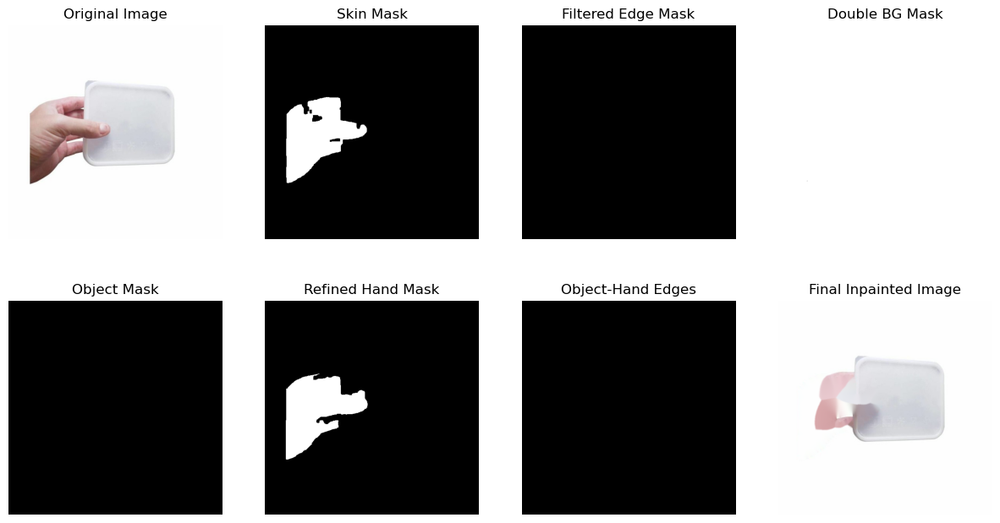

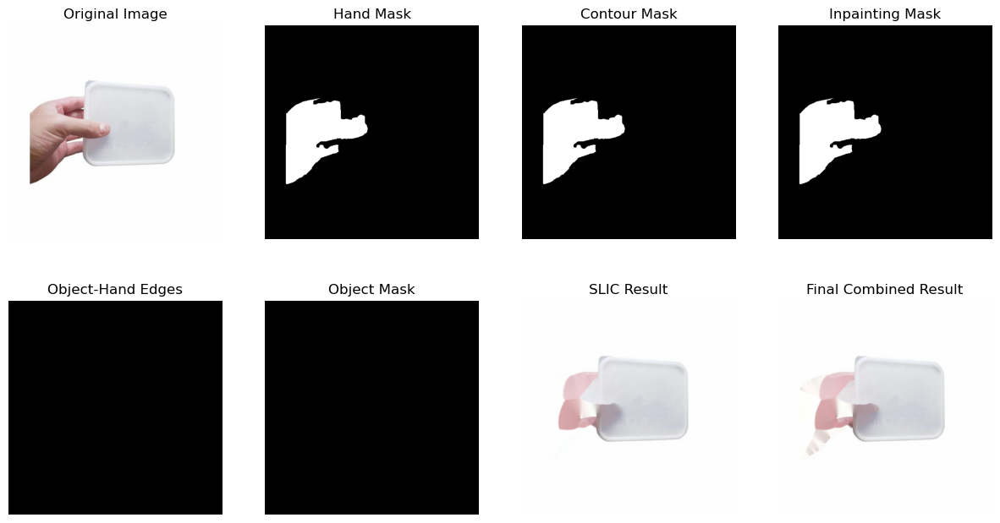

In [73]:
# Load an image and apply the pipeline
test_img = load_img(filenames[0])  # Replace with actual image
result_img = combined_approach(test_img)

### SLIC VS Felzenszwalb

In [74]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage import measure

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 12))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(3, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

# Step 1: Skin Detection with improved parameters
def skin_detect(img):
    # Convert to YCrCb color space
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    # Extract Cr component which is good for skin detection
    _, cr, _ = cv2.split(img_ycrcb)
    # Blur to reduce noise
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    # Otsu's thresholding
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Additional morphological operations to improve skin detection
    kernel = np.ones((5, 5), np.uint8)
    skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)
    skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel)
    
    return skin_mask

# Step 2: Edge Detection with parameters to capture finer details
def edge_detection(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Lower thresholds to capture more edge details
    edges = cv2.Canny(img_gray, 30, 120)
    return edges

# Step 3: Object Segmentation using multiple methods
def segment_objects(img):
    # Convert to RGB for sklearn algorithms
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if len(img.shape) == 3 and img.shape[2] == 3 else img
    
    # Use SLIC superpixels algorithm
    segments_slic = slic(img_rgb, n_segments=100, compactness=10, sigma=1, start_label=1)
    
    # Use Felzenszwalb algorithm for alternative segmentation
    segments_felzenszwalb = felzenszwalb(img_rgb, scale=100, sigma=0.5, min_size=50)
    
    # Combine results from both algorithms
    # We'll use the segments as candidates for object regions
    return segments_slic, segments_felzenszwalb

# Step 4: Feature extraction for each segment
def extract_segment_features(img, segments):
    n_segments = np.max(segments) + 1
    features = []
    
    for i in range(n_segments):
        mask = segments == i
        if np.any(mask):
            # Calculate color features
            region = img[mask]
            mean_color = np.mean(region, axis=0)
            std_color = np.std(region, axis=0)
            
            # Calculate texture features (simple gradient magnitude)
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            gradient_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
            gradient_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
            gradient_mag = np.sqrt(gradient_x**2 + gradient_y**2)
            texture_mean = np.mean(gradient_mag[mask])
            texture_std = np.std(gradient_mag[mask])
            
            # Calculate shape features
            props = measure.regionprops(mask.astype(int))[0]
            area = props.area
            perimeter = props.perimeter
            compactness = 4 * np.pi * area / (perimeter**2) if perimeter > 0 else 0
            
            features.append({
                'segment_id': i,
                'color_mean': mean_color,
                'color_std': std_color,
                'texture_mean': texture_mean,
                'texture_std': texture_std,
                'area': area,
                'perimeter': perimeter,
                'compactness': compactness
            })
    
    return features

# Step 5: Classify segments into object, hand, and background
def classify_segments(img, segments, features, skin_mask):
    height, width = img.shape[:2]
    object_mask = np.zeros((height, width), dtype=np.uint8)
    hand_mask = np.zeros((height, width), dtype=np.uint8)
    background_mask = np.zeros((height, width), dtype=np.uint8)
    
    for feature in features:
        segment_id = feature['segment_id']
        segment_mask = segments == segment_id
        
        # Calculate overlap with skin mask
        skin_overlap = np.sum(np.logical_and(segment_mask, skin_mask > 0)) / np.sum(segment_mask)
        
        # Check if segment is at border (likely background)
        border_mask = np.zeros((height, width), dtype=bool)
        border_mask[0, :] = True
        border_mask[-1, :] = True
        border_mask[:, 0] = True
        border_mask[:, -1] = True
        is_border = np.any(np.logical_and(segment_mask, border_mask))
        
        # Decision rules
        if skin_overlap > 0.5:
            # This segment is likely part of a hand
            hand_mask[segment_mask] = 255
        elif is_border or feature['compactness'] > 0.8:
            # This segment is likely background
            background_mask[segment_mask] = 255
        else:
            # This segment is likely an object
            object_mask[segment_mask] = 255
    
    return object_mask, hand_mask, background_mask

# Step 6: Refine the masks using morphological operations
def refine_masks(object_mask, hand_mask, background_mask):
    kernel = np.ones((5, 5), np.uint8)
    
    # Refine object mask
    object_mask = cv2.morphologyEx(object_mask, cv2.MORPH_CLOSE, kernel)
    
    # Refine hand mask
    hand_mask = cv2.morphologyEx(hand_mask, cv2.MORPH_CLOSE, kernel)
    
    # Refine background mask
    background_mask = cv2.morphologyEx(background_mask, cv2.MORPH_CLOSE, kernel)
    
    # Resolve conflicts (a pixel can only belong to one category)
    # Priority: object > hand > background
    conflict_mask = np.logical_and(object_mask > 0, hand_mask > 0)
    hand_mask[conflict_mask] = 0
    
    conflict_mask = np.logical_and(object_mask > 0, background_mask > 0)
    background_mask[conflict_mask] = 0
    
    conflict_mask = np.logical_and(hand_mask > 0, background_mask > 0)
    background_mask[conflict_mask] = 0
    
    # Fill any unlabeled pixels
    unlabeled = np.logical_and.reduce([object_mask == 0, hand_mask == 0, background_mask == 0])
    background_mask[unlabeled] = 255
    
    return object_mask, hand_mask, background_mask

# Step 7: Extract and preserve object-hand boundaries
def extract_object_hand_boundaries(object_mask, hand_mask, edge_mask):
    # Dilate both masks to ensure overlap at boundaries
    kernel = np.ones((3, 3), np.uint8)
    object_dilated = cv2.dilate(object_mask, kernel, iterations=1)
    hand_dilated = cv2.dilate(hand_mask, kernel, iterations=1)
    
    # Find the boundary between object and hand
    object_hand_boundary = cv2.bitwise_and(object_dilated, hand_dilated)
    
    # Find edges that are on this boundary
    object_hand_edges = cv2.bitwise_and(edge_mask, object_hand_boundary)
    
    return object_hand_edges

# Step 8: Create an inpainting mask that preserves object-hand boundaries
def create_inpainting_mask(hand_mask, object_hand_edges):
    # Create a mask that includes hand regions but excludes object-hand boundaries
    inpaint_mask = cv2.bitwise_and(hand_mask, cv2.bitwise_not(object_hand_edges))
    
    # Ensure the mask is properly formatted for inpainting
    inpaint_mask = inpaint_mask.astype(np.uint8)
    
    return inpaint_mask

# Step 9: Inpainting with preserved object edges
def inpaint_with_preserved_edges(img, inpaint_mask):
    return cv2.inpaint(img, inpaint_mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Full Pipeline with Visualization
def remove_hands_preserve_object_edges(img):
    # 1. Skin detection
    skin_mask = skin_detect(img)
    
    # 2. Edge detection
    edges = edge_detection(img)
    
    # 3. Object segmentation
    segments_slic, segments_felzenszwalb = segment_objects(img)
    
    # 4. Feature extraction (using SLIC segments)
    features = extract_segment_features(img, segments_slic)
    
    # 5. Classify segments
    object_mask, hand_mask, background_mask = classify_segments(img, segments_slic, features, skin_mask)
    
    # 6. Refine masks
    object_mask, hand_mask, background_mask = refine_masks(object_mask, hand_mask, background_mask)
    
    # 7. Extract object-hand boundaries
    object_hand_edges = extract_object_hand_boundaries(object_mask, hand_mask, edges)
    
    # 8. Create inpainting mask
    inpaint_mask = create_inpainting_mask(hand_mask, object_hand_edges)
    
    # 9. Inpainting
    img_final = inpaint_with_preserved_edges(img, inpaint_mask)
    
    # Visualization
    show_images([
        img, skin_mask, edges, cv2.cvtColor(img, cv2.COLOR_RGB2GRAY),
        object_mask, hand_mask, object_hand_edges, img_final
    ], [
        "Original Image", "Skin Mask", "Edge Mask", "Grayscale",
        "Object Mask", "Hand Mask", "Object-Hand Edges", "Final Inpainted Image"
    ], cmap='gray')
    
    return img_final, object_mask, hand_mask, background_mask, object_hand_edges

# Version with alternative segmentation (Felzenszwalb)
def remove_hands_preserve_object_edges_alt(img):
    # 1. Skin detection
    skin_mask = skin_detect(img)
    
    # 2. Edge detection
    edges = edge_detection(img)
    
    # 3. Object segmentation
    segments_slic, segments_felzenszwalb = segment_objects(img)
    
    # 4. Feature extraction (using Felzenszwalb segments)
    features = extract_segment_features(img, segments_felzenszwalb)
    
    # 5. Classify segments
    object_mask, hand_mask, background_mask = classify_segments(img, segments_felzenszwalb, features, skin_mask)
    
    # 6. Refine masks
    object_mask, hand_mask, background_mask = refine_masks(object_mask, hand_mask, background_mask)
    
    # 7. Extract object-hand boundaries
    object_hand_edges = extract_object_hand_boundaries(object_mask, hand_mask, edges)
    
    # 8. Create inpainting mask
    inpaint_mask = create_inpainting_mask(hand_mask, object_hand_edges)
    
    # 9. Inpainting
    img_final = inpaint_with_preserved_edges(img, inpaint_mask)
    
    # Visualization
    show_images([
        img, 
        mark_boundaries(img, segments_felzenszwalb), 
        object_mask, 
        hand_mask, 
        background_mask,
        object_hand_edges, 
        inpaint_mask, 
        img_final
    ], [
        "Original Image", 
        "Segmentation", 
        "Object Mask", 
        "Hand Mask", 
        "Background Mask",
        "Object-Hand Edges", 
        "Inpainting Mask", 
        "Final Inpainted Image"
    ], cmap='gray')
    
    return img_final, object_mask, hand_mask, background_mask, object_hand_edges

# Function to compare both methods
def compare_methods(img):
    # Method 1: SLIC-based
    img_final1, object_mask1, hand_mask1, background_mask1, edges1 = remove_hands_preserve_object_edges(img)
    
    # Method 2: Felzenszwalb-based
    img_final2, object_mask2, hand_mask2, background_mask2, edges2 = remove_hands_preserve_object_edges_alt(img)
    
    # Visualization
    show_images([
        img, img_final1, img_final2,
        object_mask1, object_mask2,
        hand_mask1, hand_mask2,
        edges1, edges2
    ], [
        "Original Image", "SLIC Result", "Felzenszwalb Result",
        "SLIC Object Mask", "Felzenszwalb Object Mask",
        "SLIC Hand Mask", "Felzenszwalb Hand Mask",
        "SLIC Object-Hand Edges", "Felzenszwalb Object-Hand Edges"
    ], cmap='gray')
    
    return img_final1, img_final2

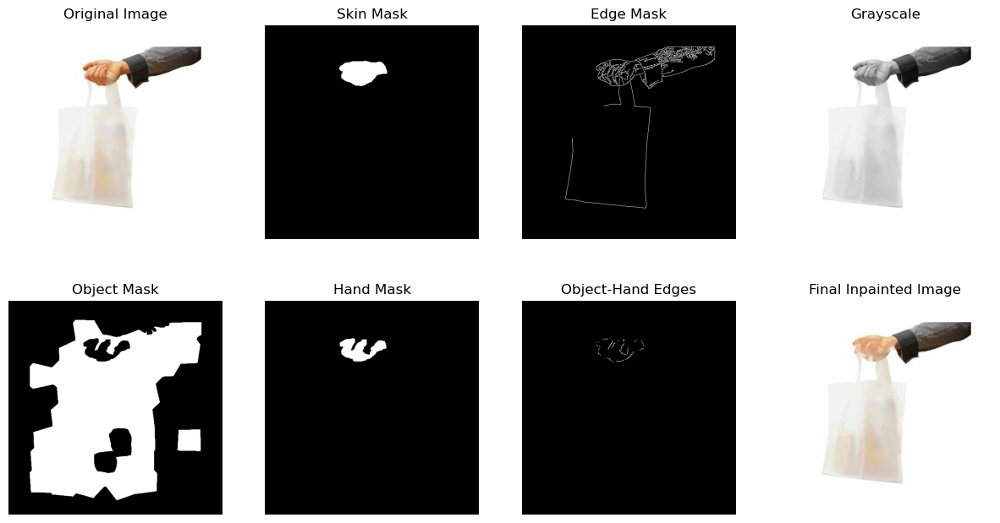

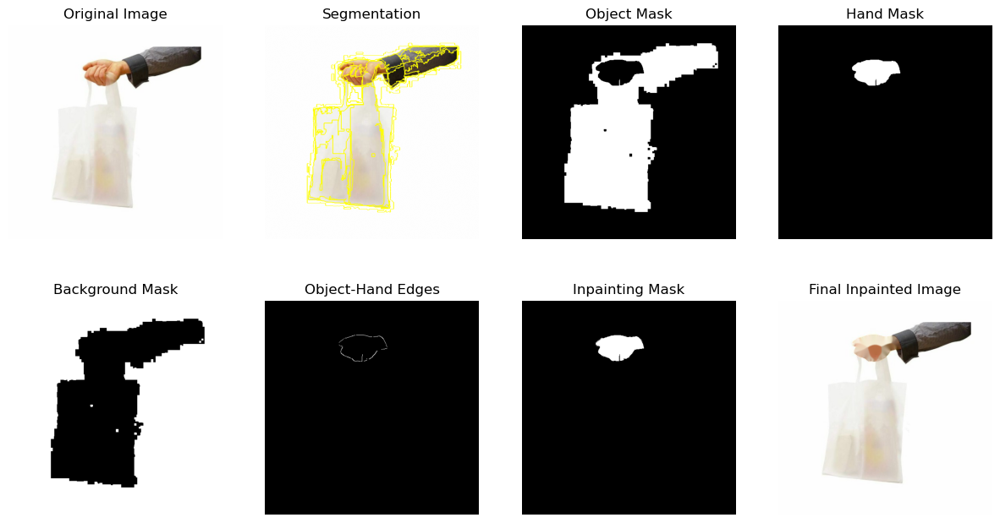

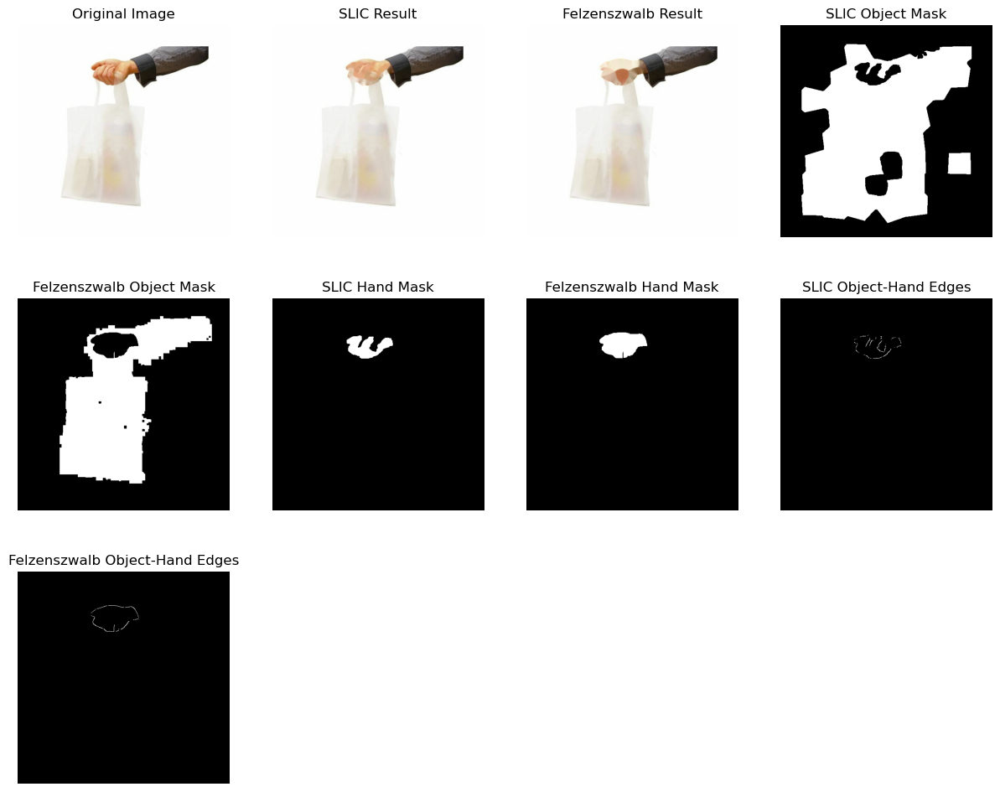

In [75]:
# Load an image and apply the pipeline
test_img = load_img(filenames[60])  # Replace with actual image
result_img = compare_methods(test_img)

### V3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


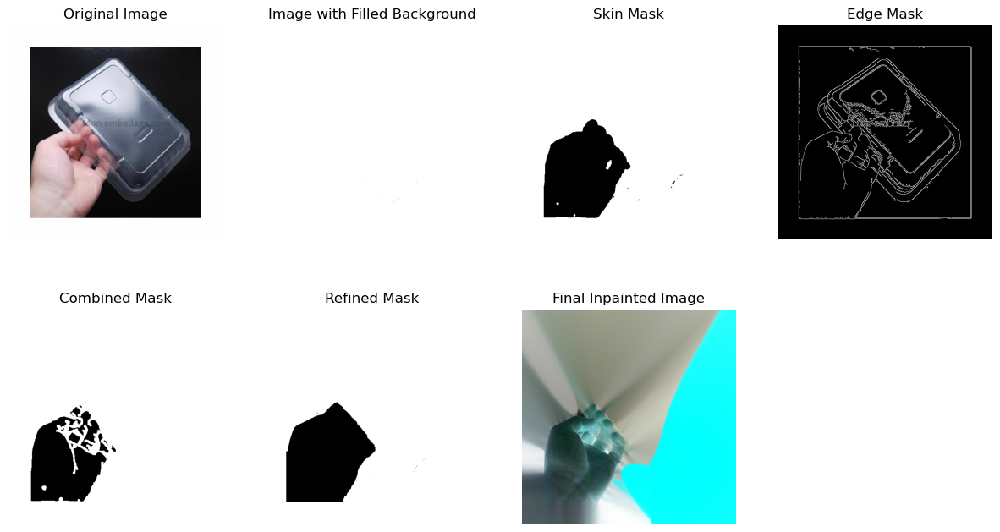

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_images(images, titles, cmap=None):
    plt.figure(figsize=(15, 8))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(2, 4, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.show()

def skin_detect(img):
    # Ensure the image is in the correct 8-bit format
    if img.dtype != np.uint8:
        img = np.uint8(img * 255)  # Convert from float to uint8 if necessary

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    _, cr, _ = cv2.split(img_ycrcb)
    cr_blur = cv2.GaussianBlur(cr, (5, 5), 0)
    _, skin_mask = cv2.threshold(cr_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return skin_mask

def edge_detection(img):
    # Ensure the image is in the correct 8-bit format
    if img.dtype != np.uint8:
        img = np.uint8(img * 255)  # Convert from float to uint8 if necessary

    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 50, 150)
    return edges


# Step 3: Detect Straight Lines (Borders)
def detect_straight_lines(img, threshold=100):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold, minLineLength=100, maxLineGap=10)
    return lines

# Step 4: Fill Outer Background with Inner Background Color
def fill_outer_background(img, lines):
    # Identify bounding box of the inner image (inside the straight lines)
    if lines is None:
        return img  # If no lines detected, return the original image

    # Create a mask of the detected lines (binary mask where the lines are 255)
    mask = np.zeros_like(img, dtype=np.uint8)
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(mask, (x1, y1), (x2, y2), (255, 255, 255), 2)

    # Convert mask to a single channel (grayscale) binary mask for bounding box calculation
    mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

    # Find the bounding box of the inner region (where lines form a rectangle)
    rect = cv2.boundingRect(mask_gray)
    x, y, w, h = rect

    # Extract the inner image and the background
    inner_img = img[y:y+h, x:x+w]
    outer_background = np.ones_like(img) * np.mean(inner_img, axis=(0, 1))  # Fill with inner background color

    # Combine the inner image with the new background
    outer_background[y:y+h, x:x+w] = inner_img
    return outer_background

def refine_mask_with_grabcut(img, mask):
    # Ensure the image is in the correct 8-bit color format
    if img.dtype != np.uint8:
        img = np.uint8(img * 255)  # Convert from float to uint8 if necessary

    # Check if the image is in grayscale, if so, convert it to BGR
    if len(img.shape) == 2:  # Grayscale image
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    # Initialize the GrabCut algorithm
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    # Set the mask for GrabCut
    mask_grabcut = np.zeros_like(mask, np.uint8)
    mask_grabcut[mask == 0] = cv2.GC_BGD
    mask_grabcut[mask == 255] = cv2.GC_FGD
    mask_grabcut[mask == 127] = cv2.GC_PR_BGD
    mask_grabcut[mask == 255] = cv2.GC_PR_FGD

    # Run GrabCut with improved initial mask
    cv2.grabCut(img, mask_grabcut, None, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_MASK)

    # Create the final mask (foreground + probable foreground)
    refined_mask = np.where((mask_grabcut == cv2.GC_FGD) | (mask_grabcut == cv2.GC_PR_FGD), 255, 0).astype('uint8')

    return refined_mask


def inpaint_image(img, mask):
    # Ensure the image is in uint8 format and has 3 channels (BGR/RGB)
    if img.dtype != np.uint8:
        img = np.uint8(img * 255)  # Convert from float to uint8 if necessary

    if len(img.shape) == 2:  # Grayscale image
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    # Ensure the mask is single-channel (binary)
    if len(mask.shape) == 3:  # If mask has 3 channels (e.g., RGB)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    elif len(mask.shape) != 2:  # If it's not 2D (grayscale), raise an error
        raise ValueError("Mask must be a 2D grayscale image")

    # Apply inpainting
    inpainted_img = cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

    return inpainted_img


# Full Pipeline with Debugging
def remove_human_parts_with_visualization(img):
    # Detect straight lines (borders) to identify inner and outer regions
    lines = detect_straight_lines(img)

    # If lines are detected, fill outer background with the inner background color
    img_with_filled_bg = fill_outer_background(img, lines)

    # Skin detection
    skin_mask = skin_detect(img_with_filled_bg)

    # Edge detection
    edges = edge_detection(img_with_filled_bg)

    # Combine skin and edge masks
    combined_mask = cv2.bitwise_or(skin_mask, edges)
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.dilate(combined_mask, kernel, iterations=1)

    # Refine mask using GrabCut
    refined_mask = refine_mask_with_grabcut(img_with_filled_bg, combined_mask)

    # Inpainting
    img_final = inpaint_image(img_with_filled_bg, refined_mask)

    # Visualization
    show_images([
        img, img_with_filled_bg, skin_mask, edges, combined_mask, refined_mask, img_final
    ], [
        "Original Image", "Image with Filled Background", "Skin Mask", "Edge Mask", "Combined Mask", "Refined Mask", "Final Inpainted Image"
    ], cmap='gray')

    return img_final

# Load an image and apply the pipeline
test_img = load_img(filenames[20])  # Replace with actual image
result_img = remove_human_parts_with_visualization(test_img)
